In [14]:
import cv2 as cv
import numpy as np
import glob
import pickle
import ml_metrics
import math
import os
import yaml
from evaluation_funcs import performance_accumulation_pixel 
from evaluation_funcs import performance_evaluation_pixel
from matplotlib import pyplot as plt
from scipy import ndimage

#Show images in horizontal
from matplotlib.pyplot import figure, imshow, axis
from matplotlib.image import imread

In [2]:
def showImagesHorizontally(list_of_files, titles):
    fig=plt.figure(figsize=(18, 16), dpi= 80, facecolor='w', edgecolor='k')
    #fig = figure()
    number_of_files = len(list_of_files)
    j=0
    for i in range(number_of_files):
        
        a = fig.add_subplot(1,number_of_files,i+1)
        image = list_of_files[i]
        imshow(image,cmap='Greys_r')
        ax1 = axis('off')
        a.set_title(titles[j])
        a.set_xlabel(np.shape(image))
        j = j+1
        


In [3]:
def show_img_cs(img,colorspace):
    plt.imshow(img, colorspace)
    plt.show()
    
def show_img_gray(img, title):
    print(title)
    plt.imshow(img, cmap = plt.cm.gray)
    plt.show()
    
def show_img_gray(img):
    plt.imshow(img, cmap = plt.cm.gray)
    plt.show()
    
def show_img(img, title):
    print(title)
    plt.imshow(img)
    plt.show()
    
def show_img(img):
    plt.imshow(img)
    plt.show()

(323, 609)
(2, 1940, 3652)
(96, 188)
(2, 577, 1125)
(109, 185)
(2, 653, 1110)
(162, 176)
(2, 975, 1059)
(71, 148)
(1, 428, 889)
(126, 240)
(1, 759, 1437)
(385, 641)
(1, 2311, 3844)
(113, 263)
(3, 679, 1576)
(396, 663)
(2, 2379, 3978)
(313, 416)
(1, 1876, 2499)
(170, 254)
(3, 1017, 1523)
(471, 489)
(1, 2826, 2936)
(100, 261)
(3, 598, 1564)
(265, 255)
(1, 1590, 1529)
(147, 242)
(2, 882, 1449)
(250, 122)
(2, 1498, 732)
(124, 236)
(3, 743, 1419)
(283, 665)
(2, 1697, 3988)
(126, 254)
(2, 753, 1524)
(128, 235)
(3, 770, 1409)
(407, 440)
(1, 2441, 2642)
(247, 412)
(1, 1480, 2474)
(405, 636)
(1, 2430, 3819)
(98, 212)
(2, 586, 1273)
(460, 456)
(1, 2758, 2736)
(525, 485)
(1, 3151, 2909)
(101, 146)
(2, 607, 875)
(353, 639)
(2, 2117, 3835)
(497, 426)
(1, 2980, 2556)
(122, 258)
(2, 730, 1545)
F-measure: 0.9137912879643011


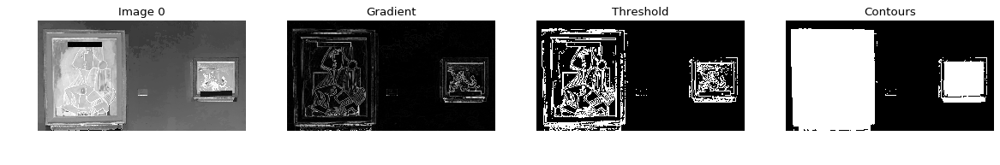

<Figure size 432x288 with 0 Axes>

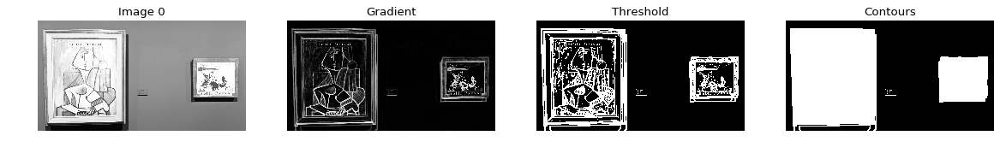

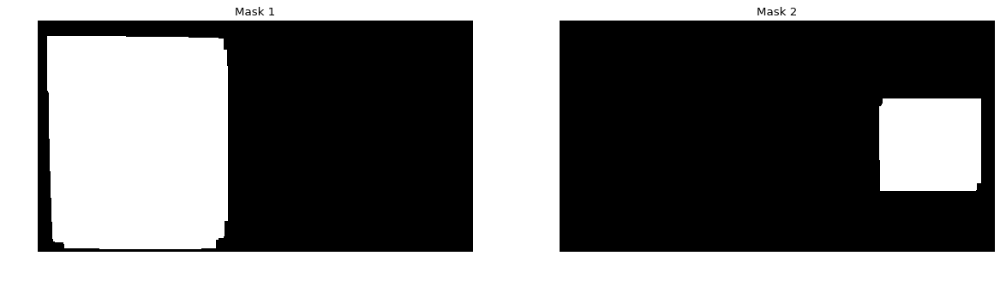

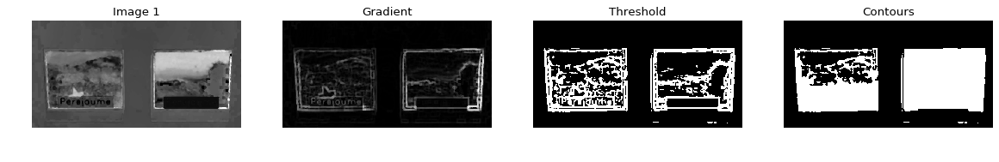

<Figure size 432x288 with 0 Axes>

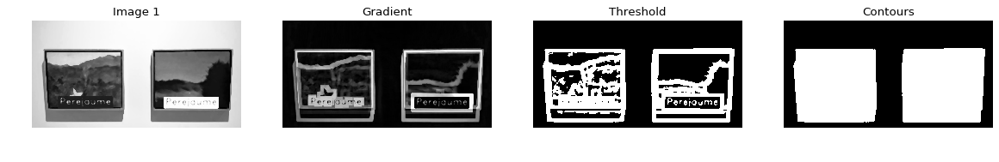

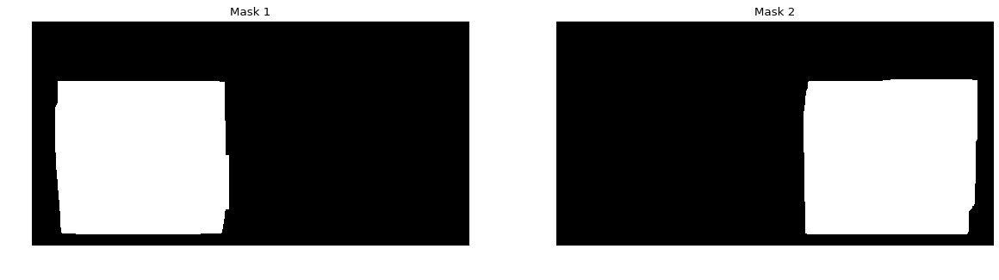

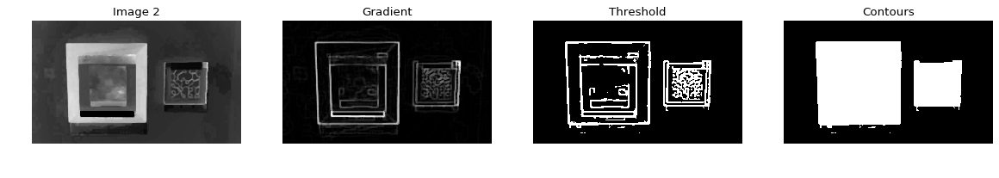

<Figure size 432x288 with 0 Axes>

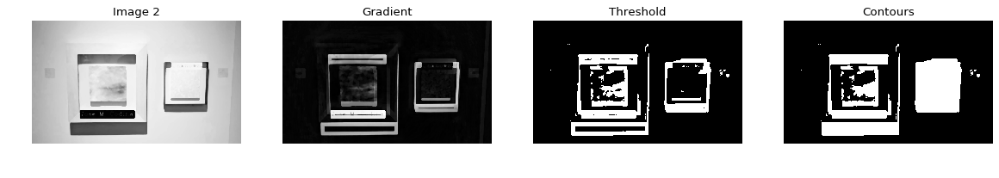

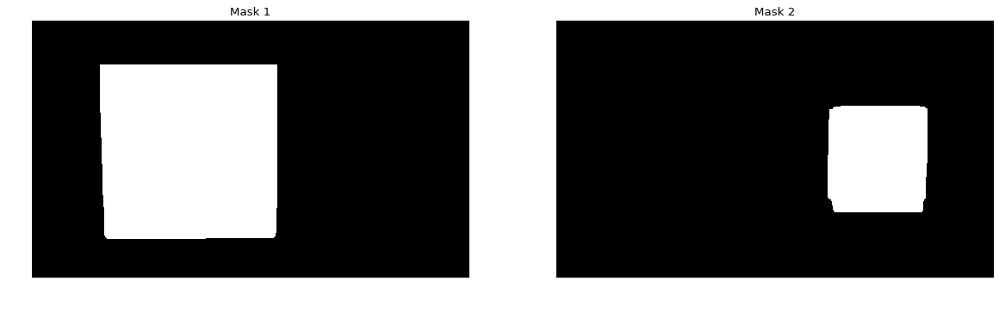

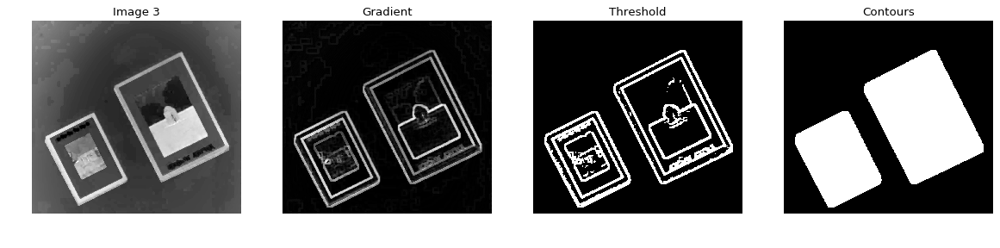

<Figure size 432x288 with 0 Axes>

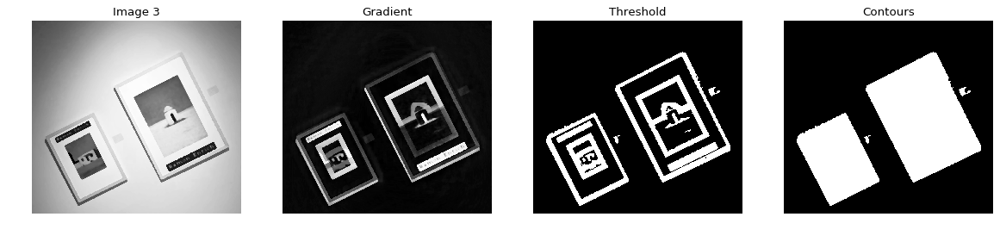

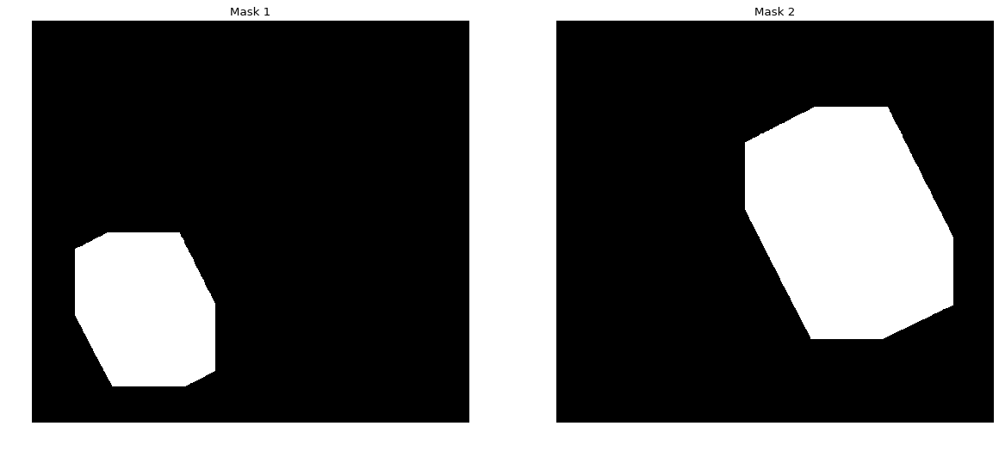

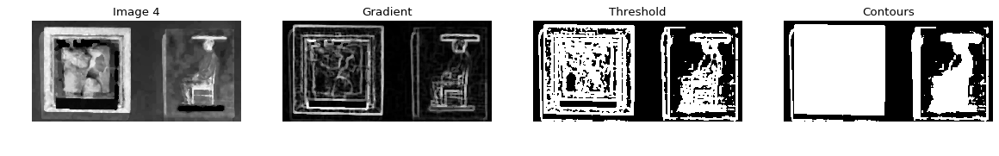

<Figure size 432x288 with 0 Axes>

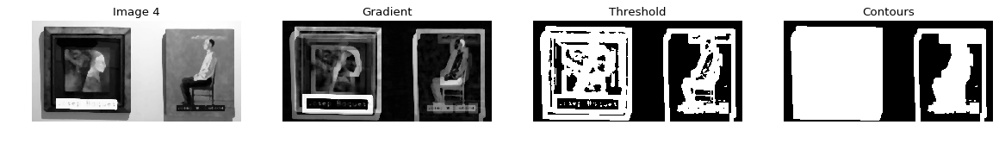

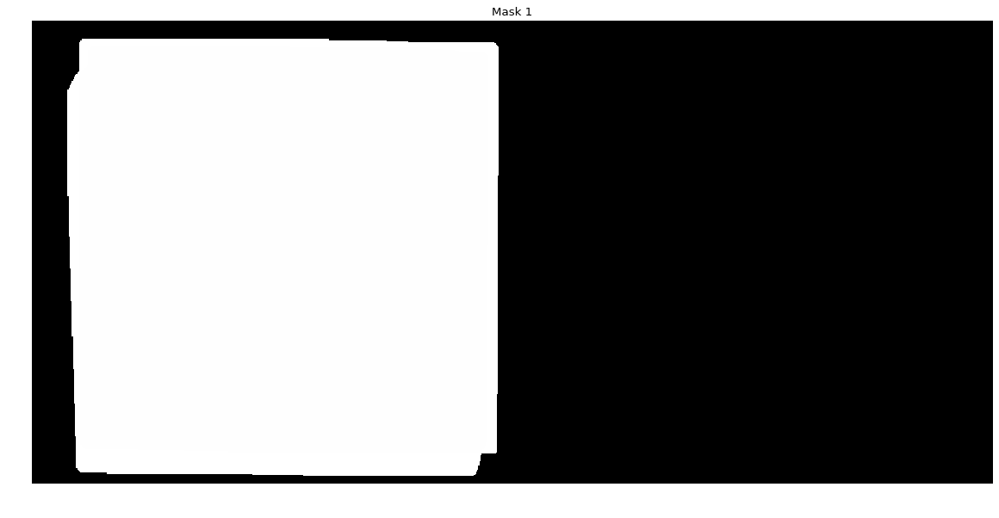

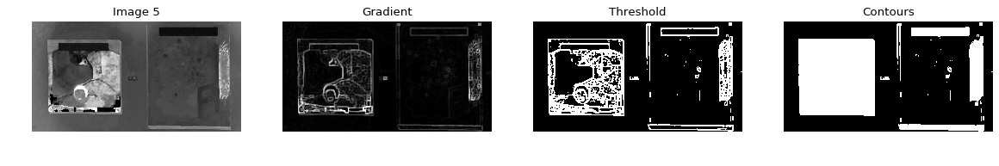

<Figure size 432x288 with 0 Axes>

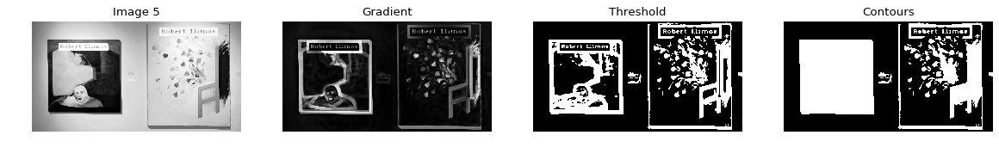

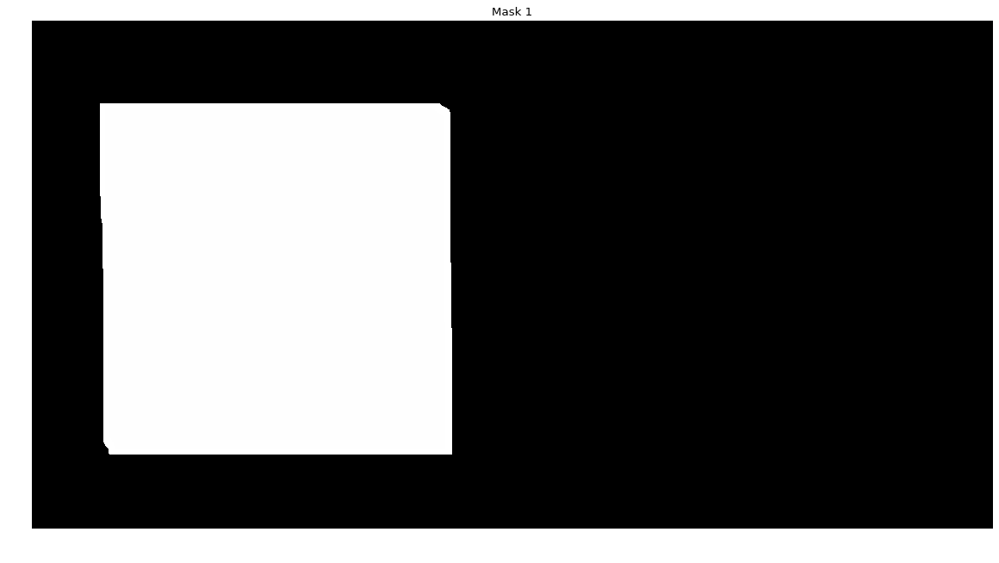

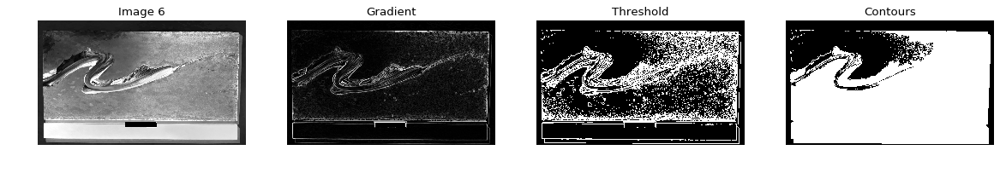

<Figure size 432x288 with 0 Axes>

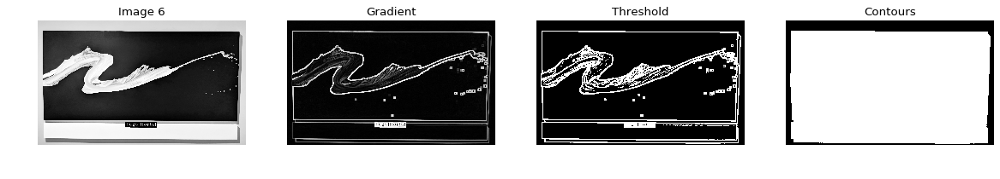

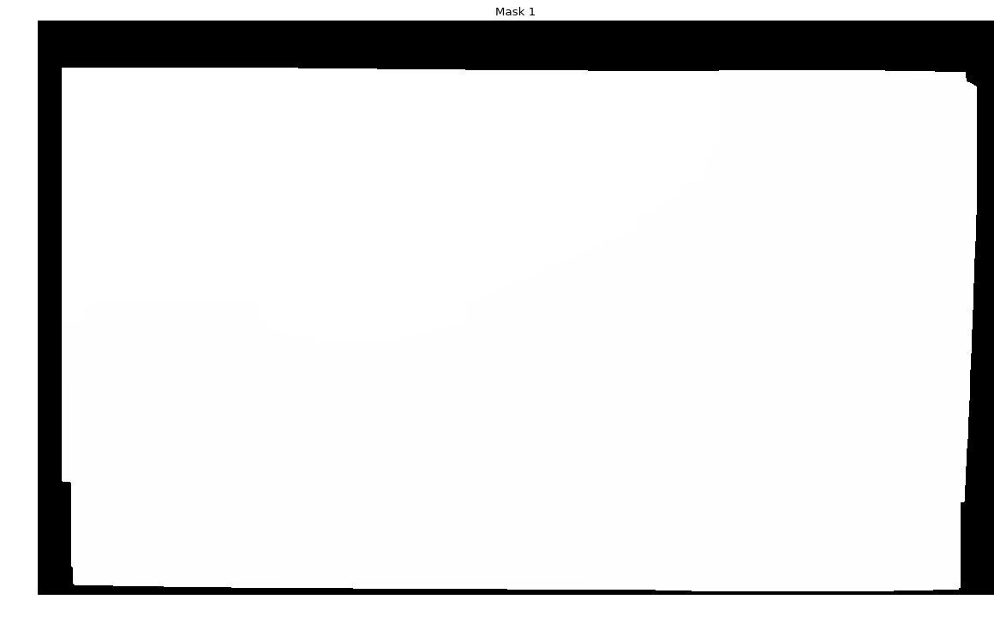

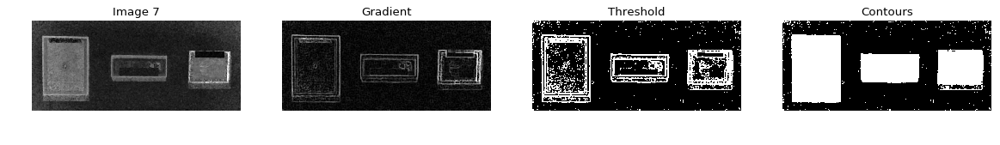

<Figure size 432x288 with 0 Axes>

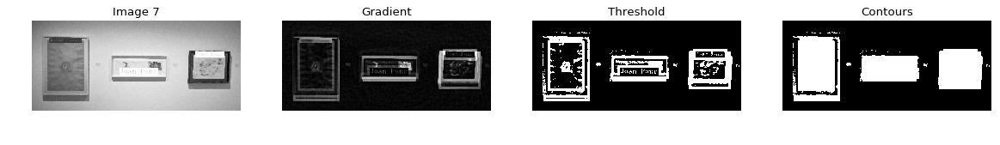

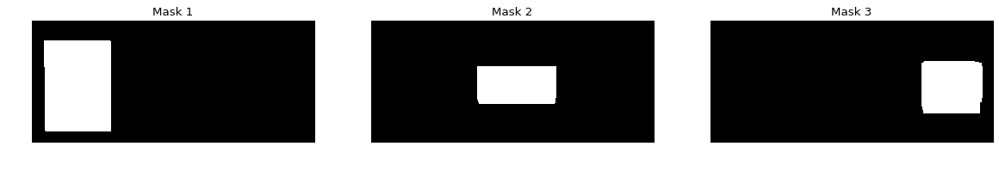

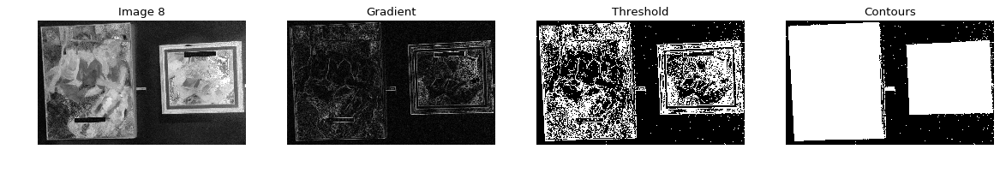

<Figure size 432x288 with 0 Axes>

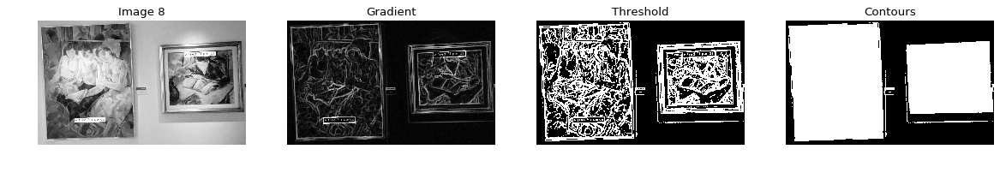

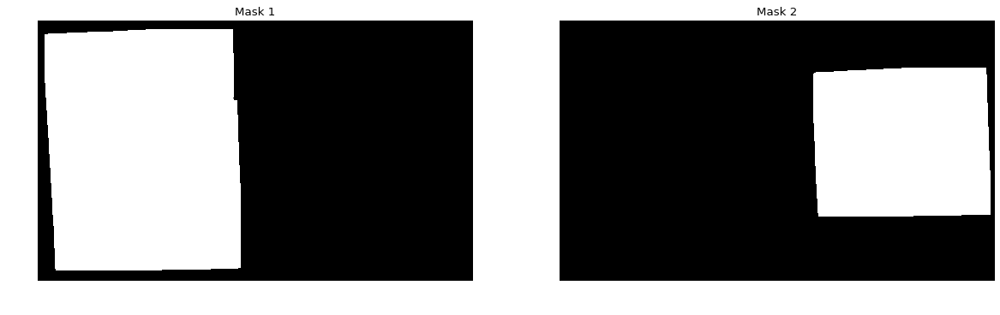

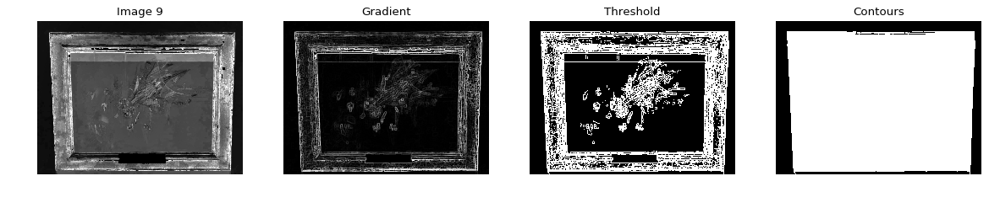

<Figure size 432x288 with 0 Axes>

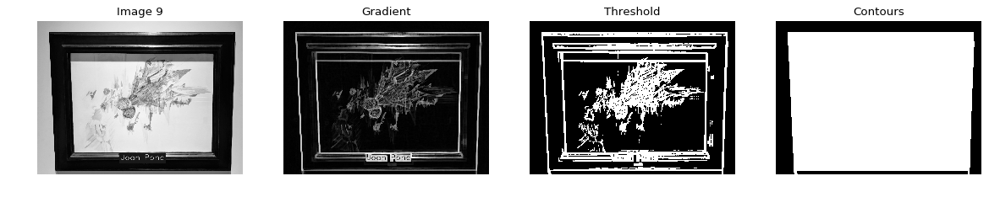

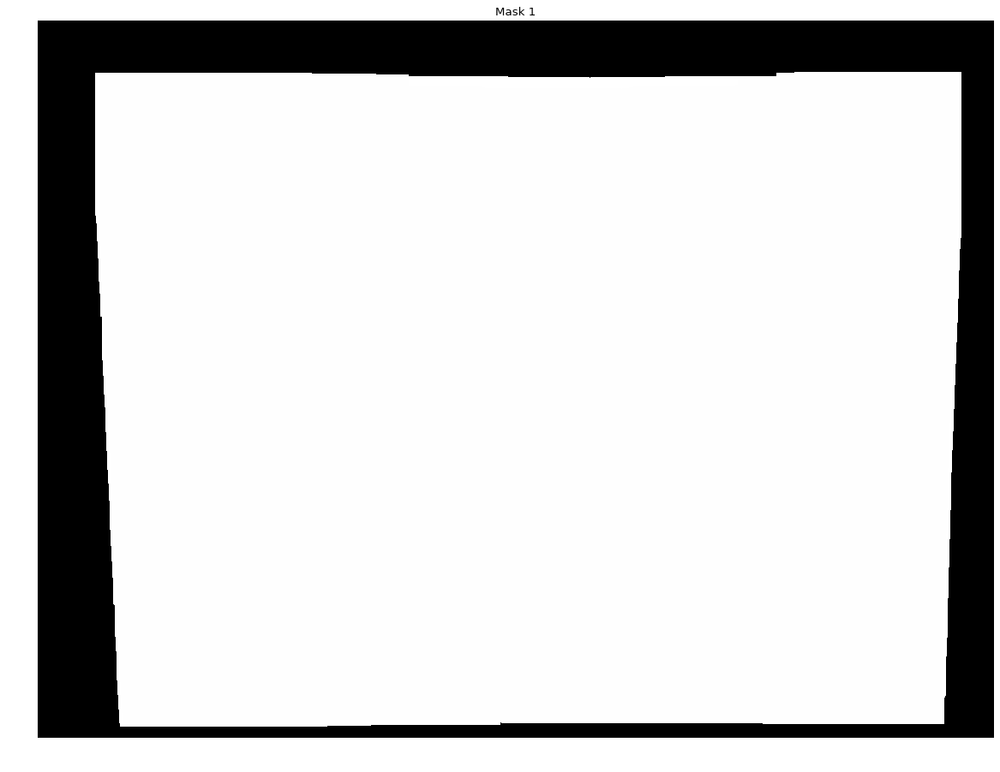

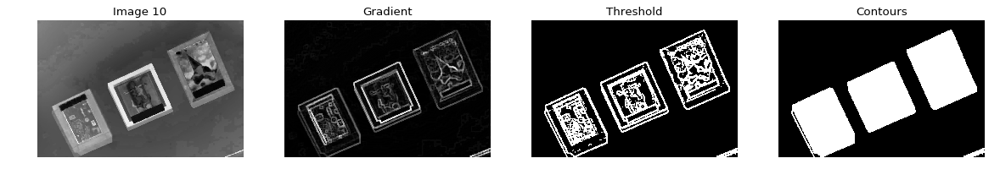

<Figure size 432x288 with 0 Axes>

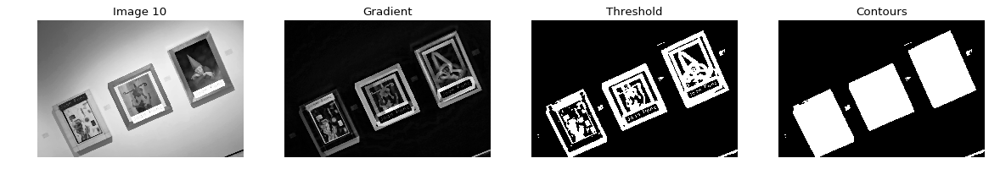

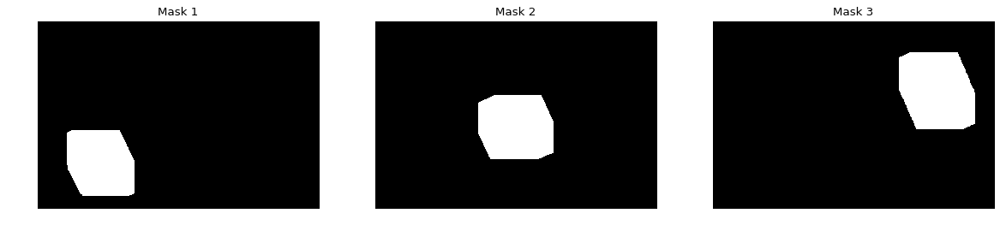

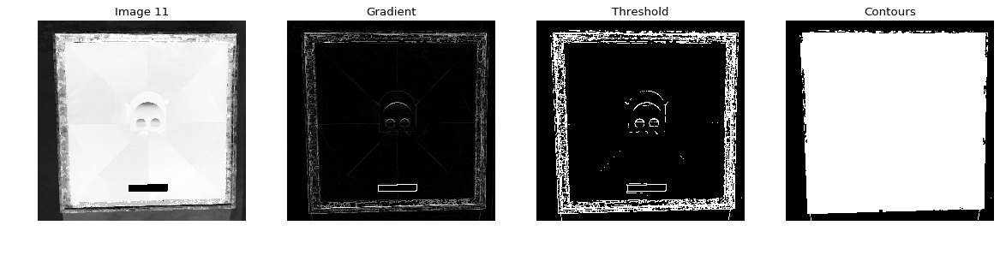

<Figure size 432x288 with 0 Axes>

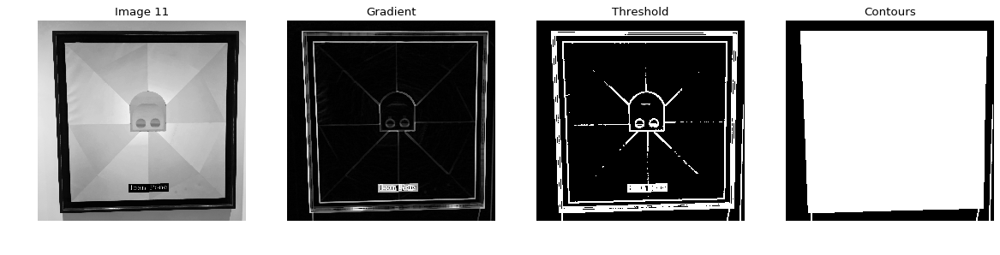

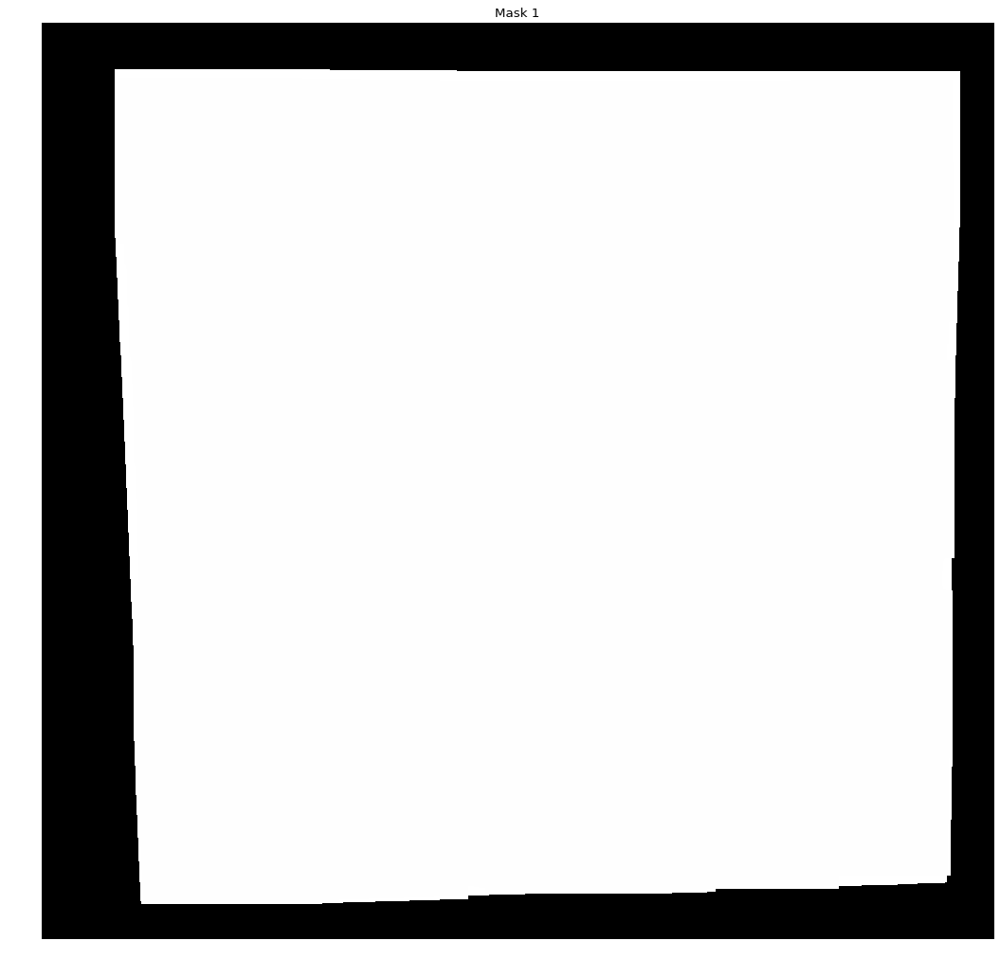

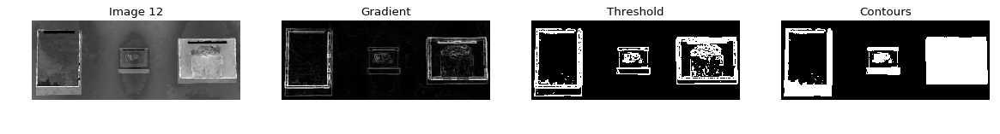

<Figure size 432x288 with 0 Axes>

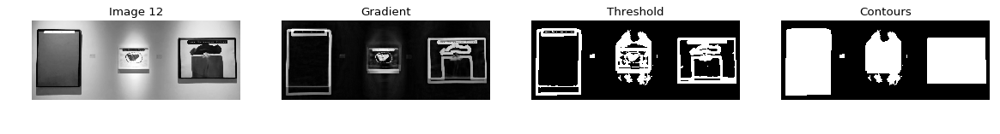

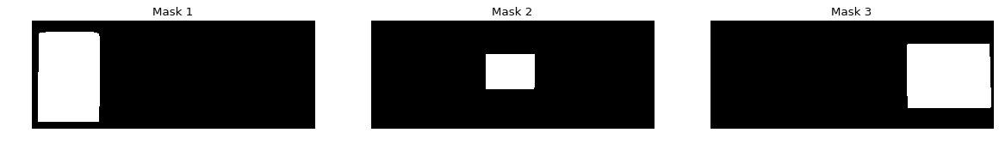

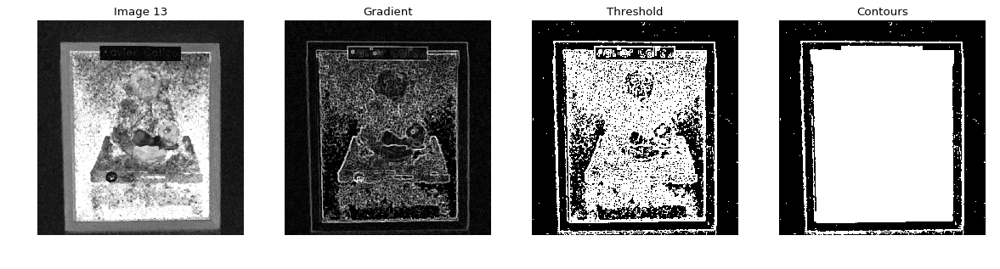

<Figure size 432x288 with 0 Axes>

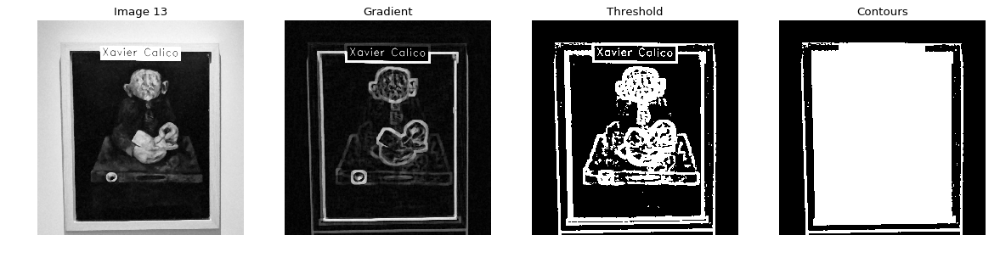

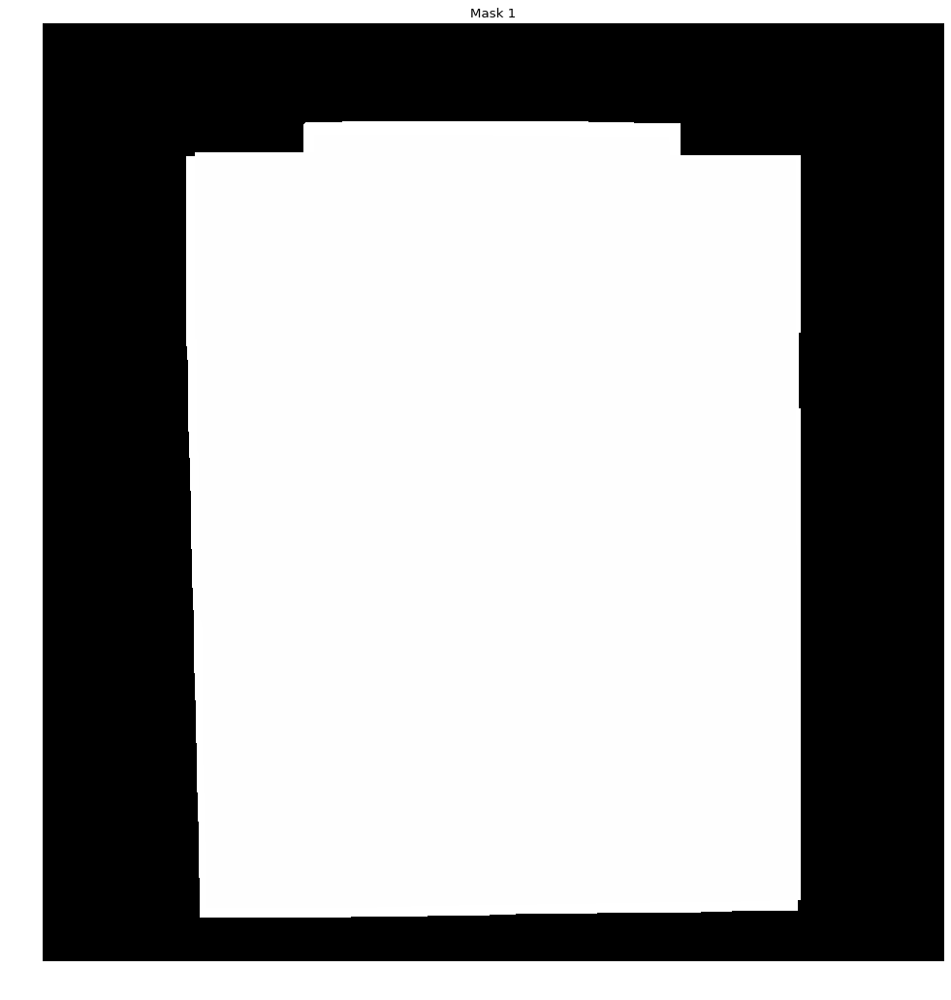

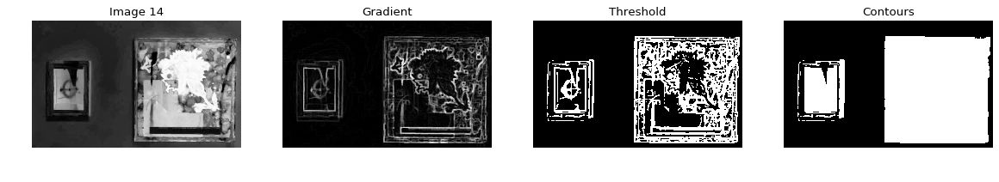

<Figure size 432x288 with 0 Axes>

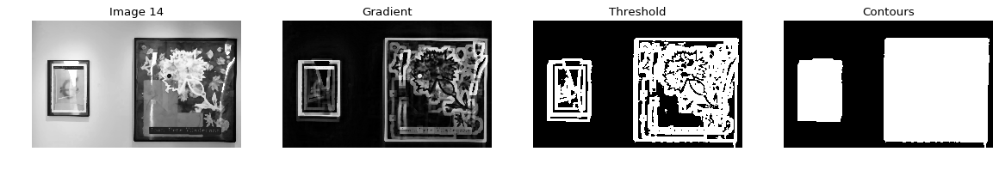

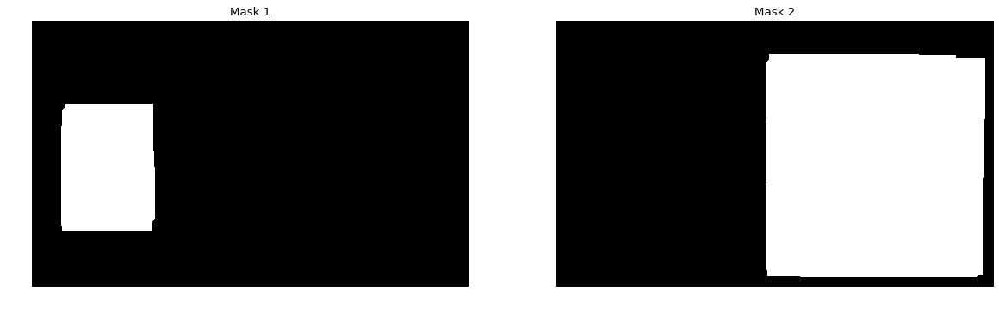

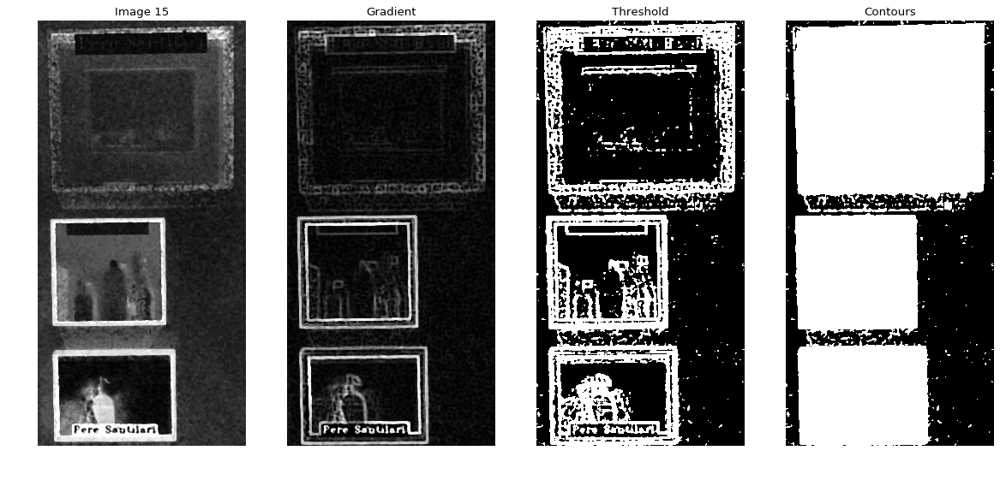

<Figure size 432x288 with 0 Axes>

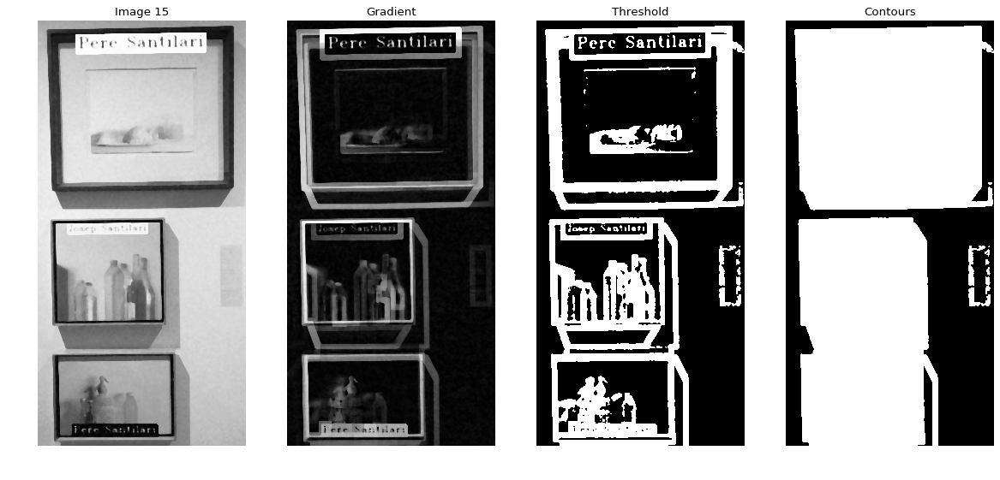

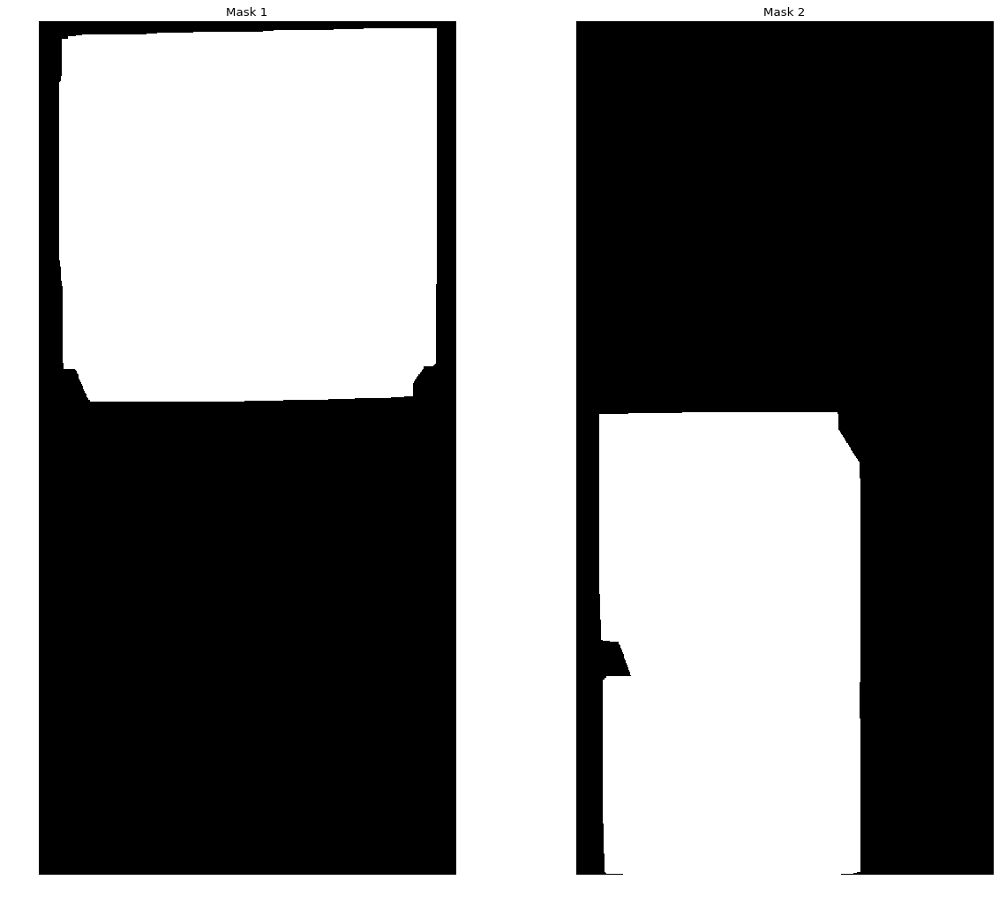

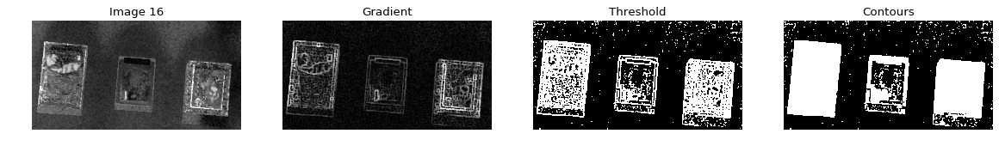

<Figure size 432x288 with 0 Axes>

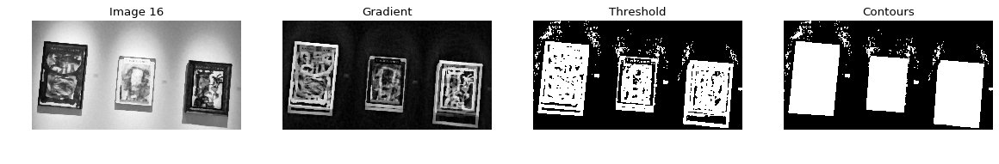

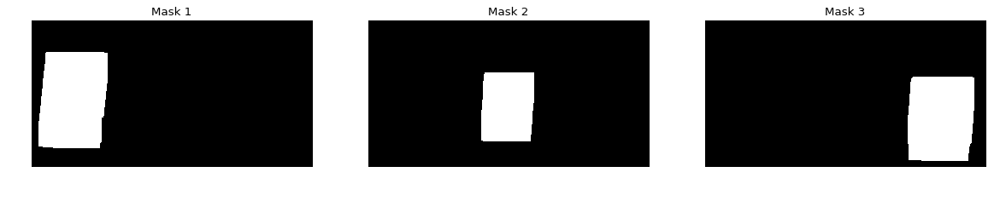

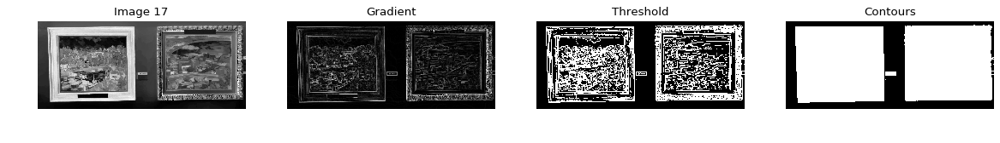

<Figure size 432x288 with 0 Axes>

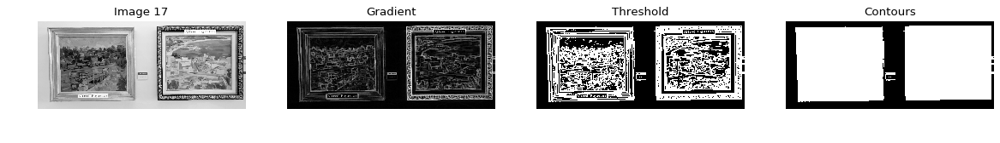

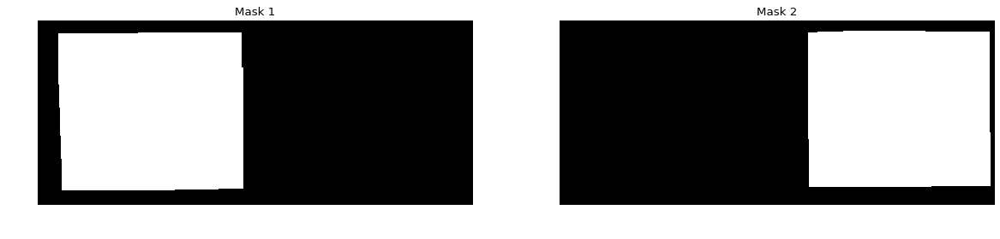

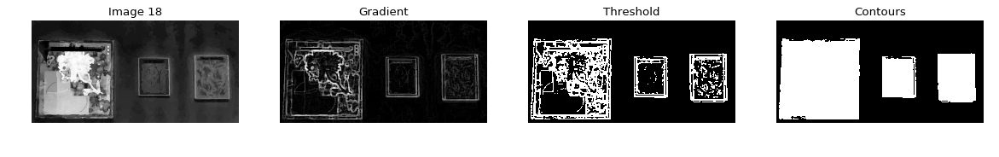

<Figure size 432x288 with 0 Axes>

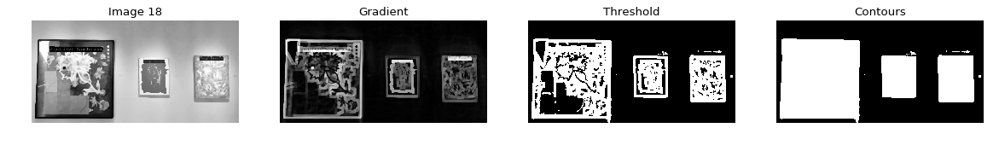

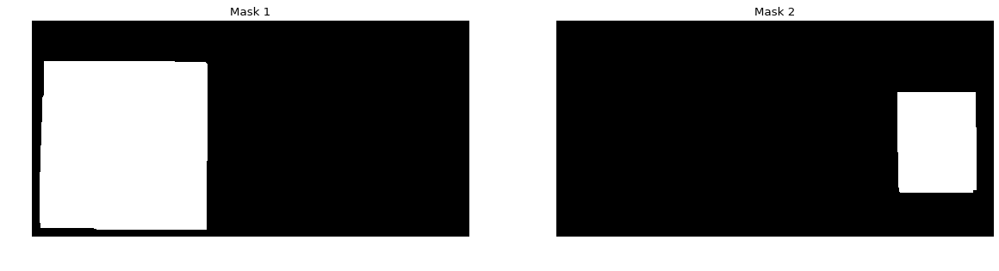

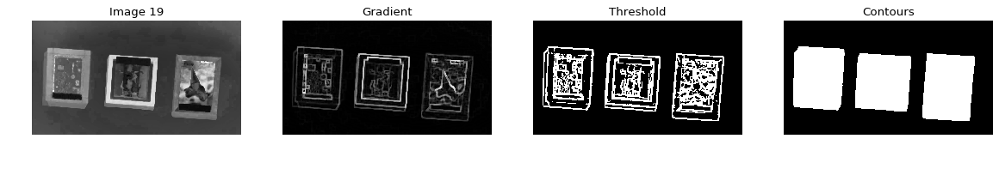

<Figure size 432x288 with 0 Axes>

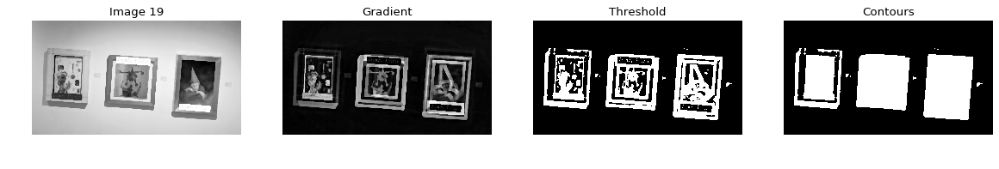

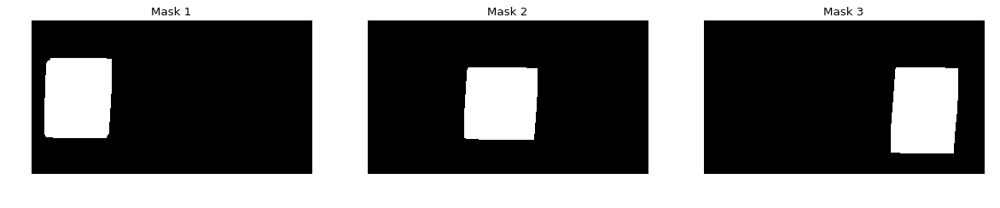

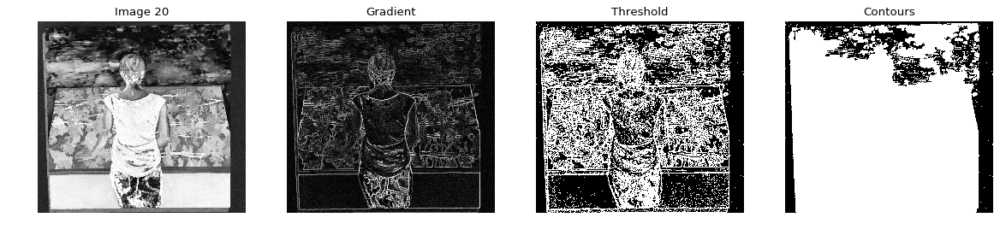

<Figure size 432x288 with 0 Axes>

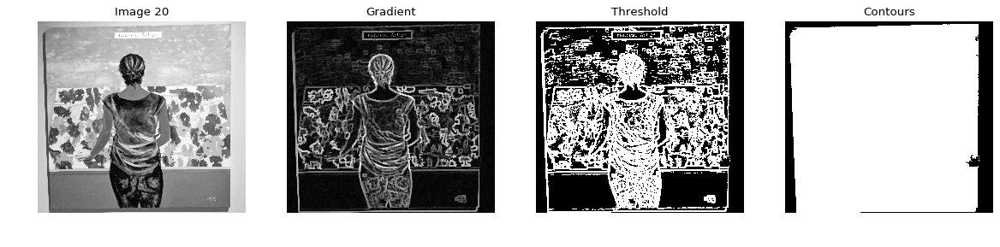

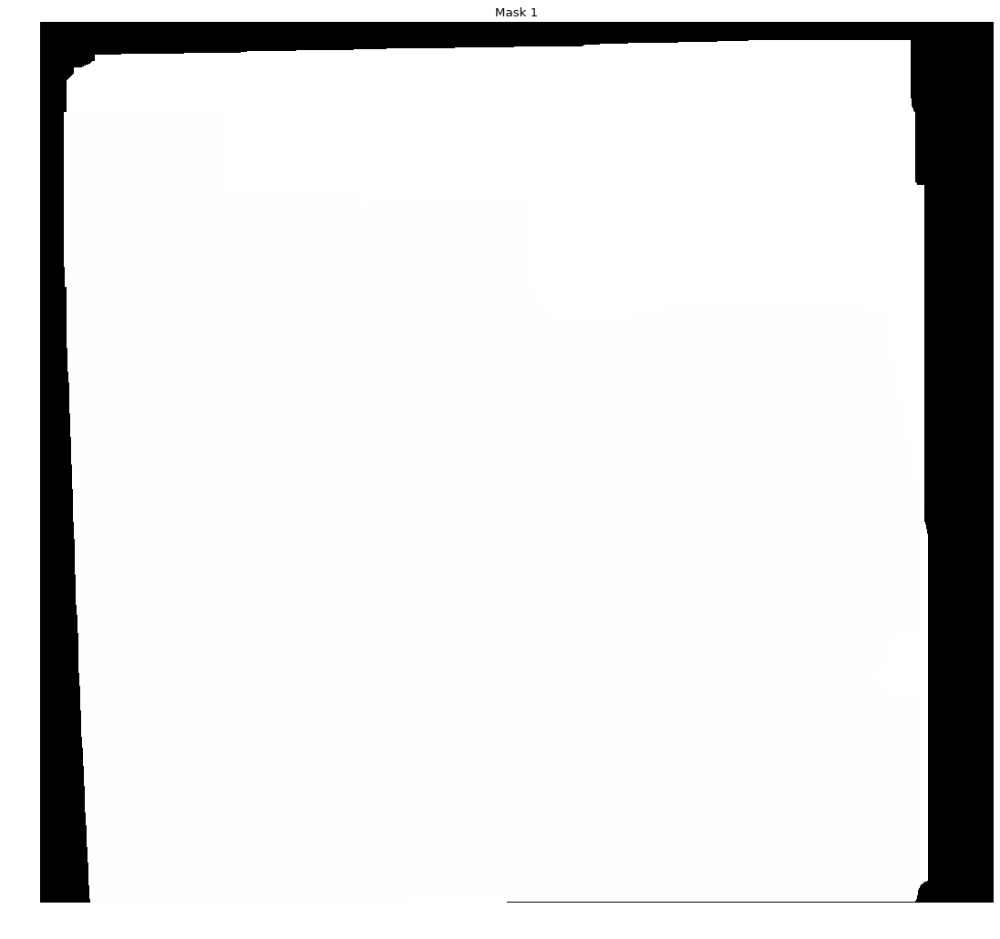

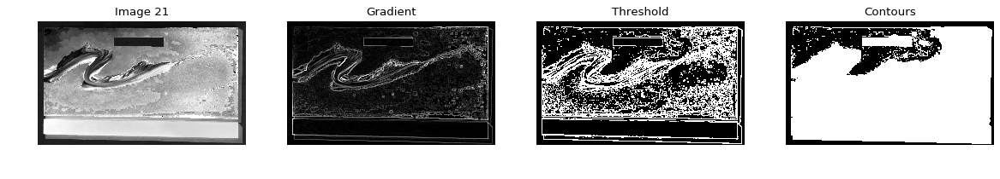

<Figure size 432x288 with 0 Axes>

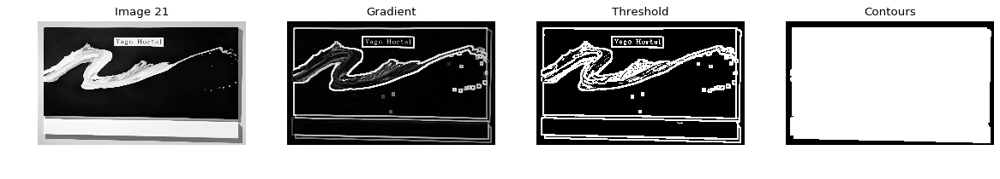

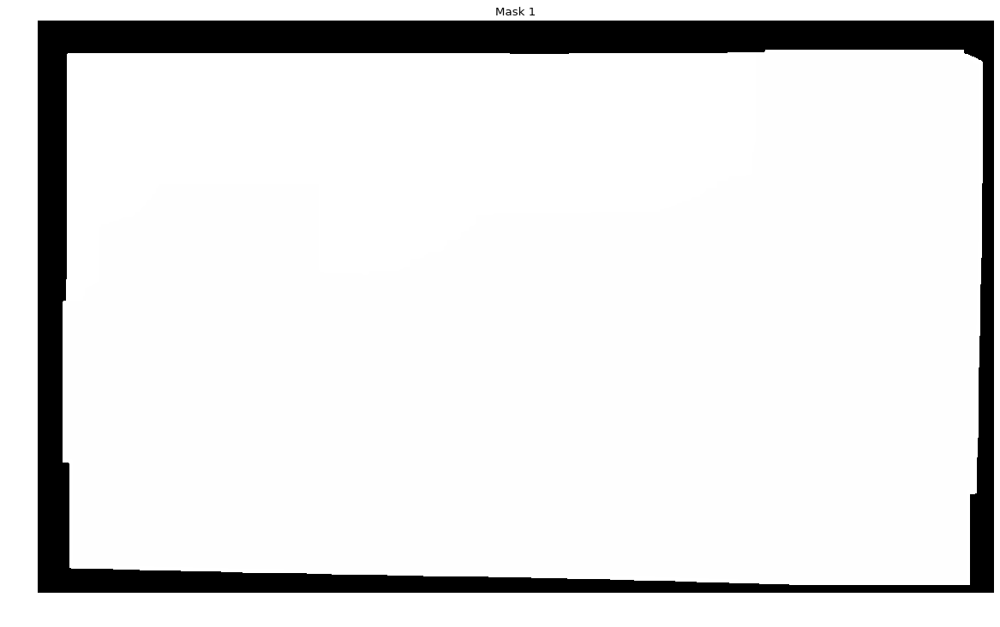

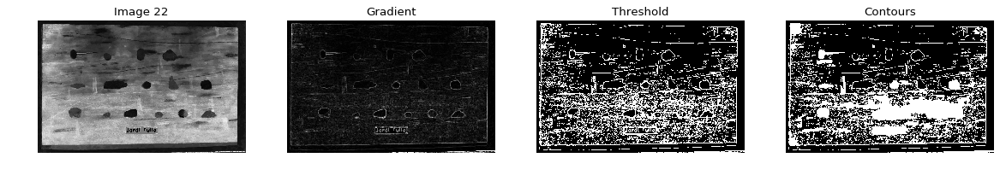

<Figure size 432x288 with 0 Axes>

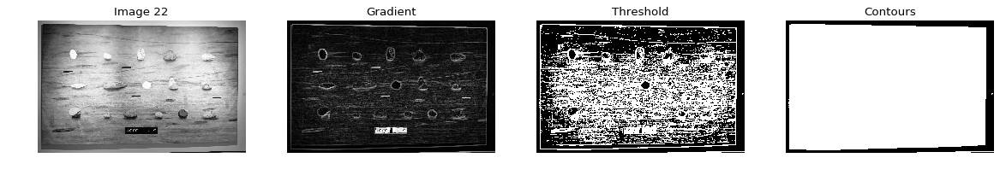

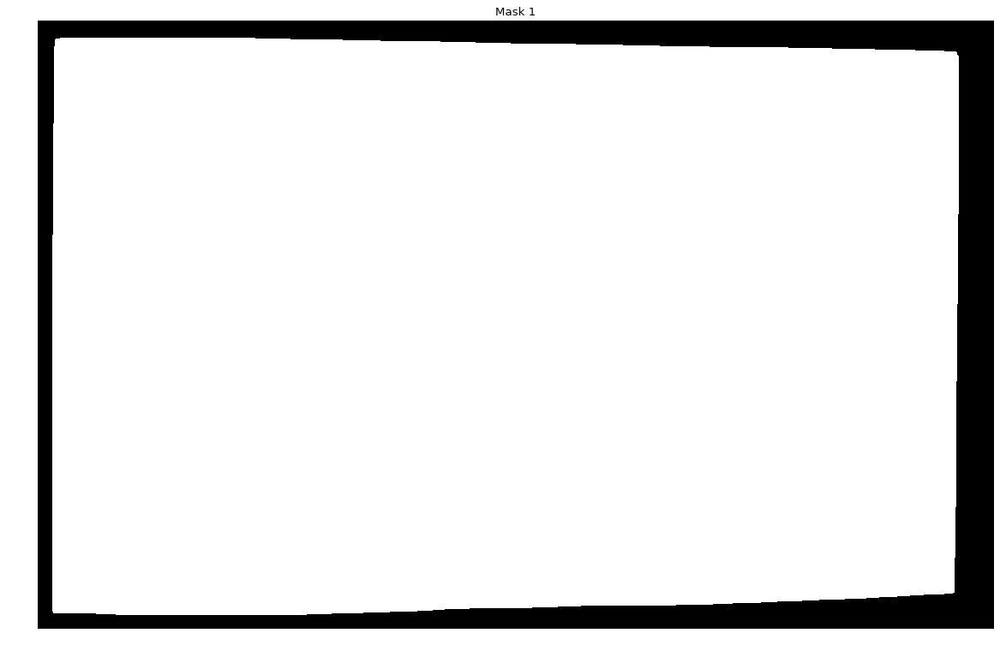

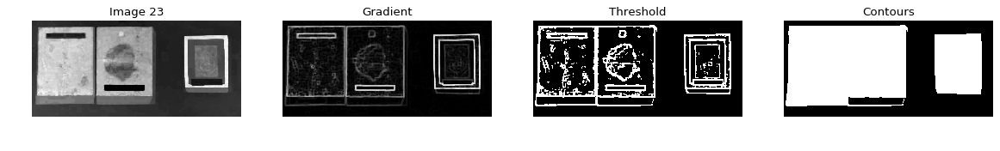

<Figure size 432x288 with 0 Axes>

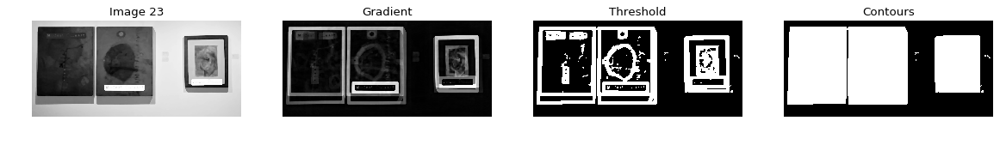

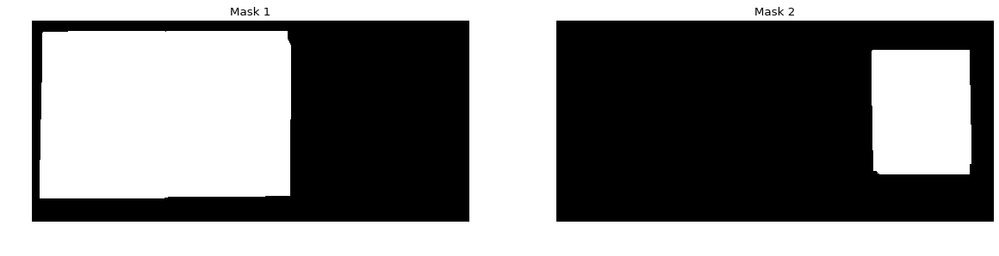

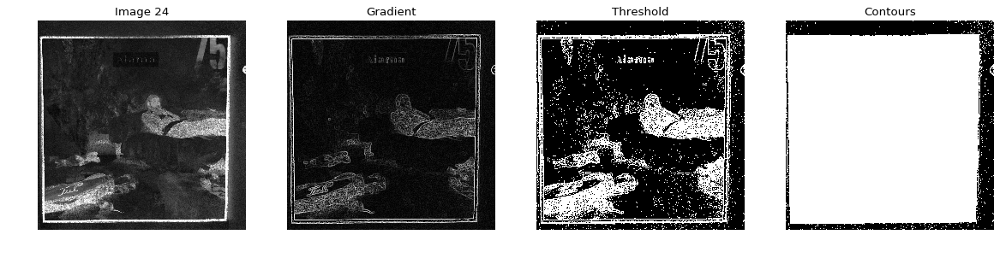

<Figure size 432x288 with 0 Axes>

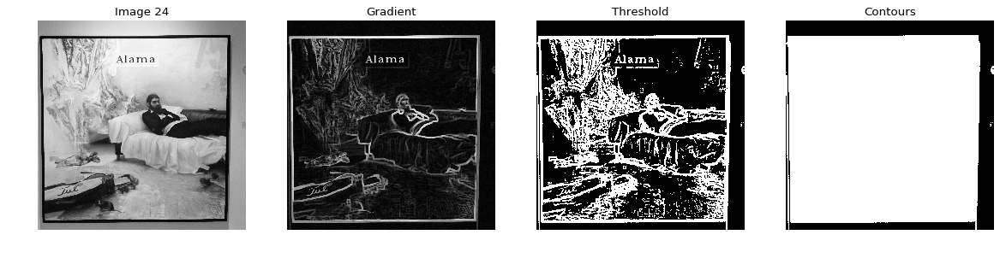

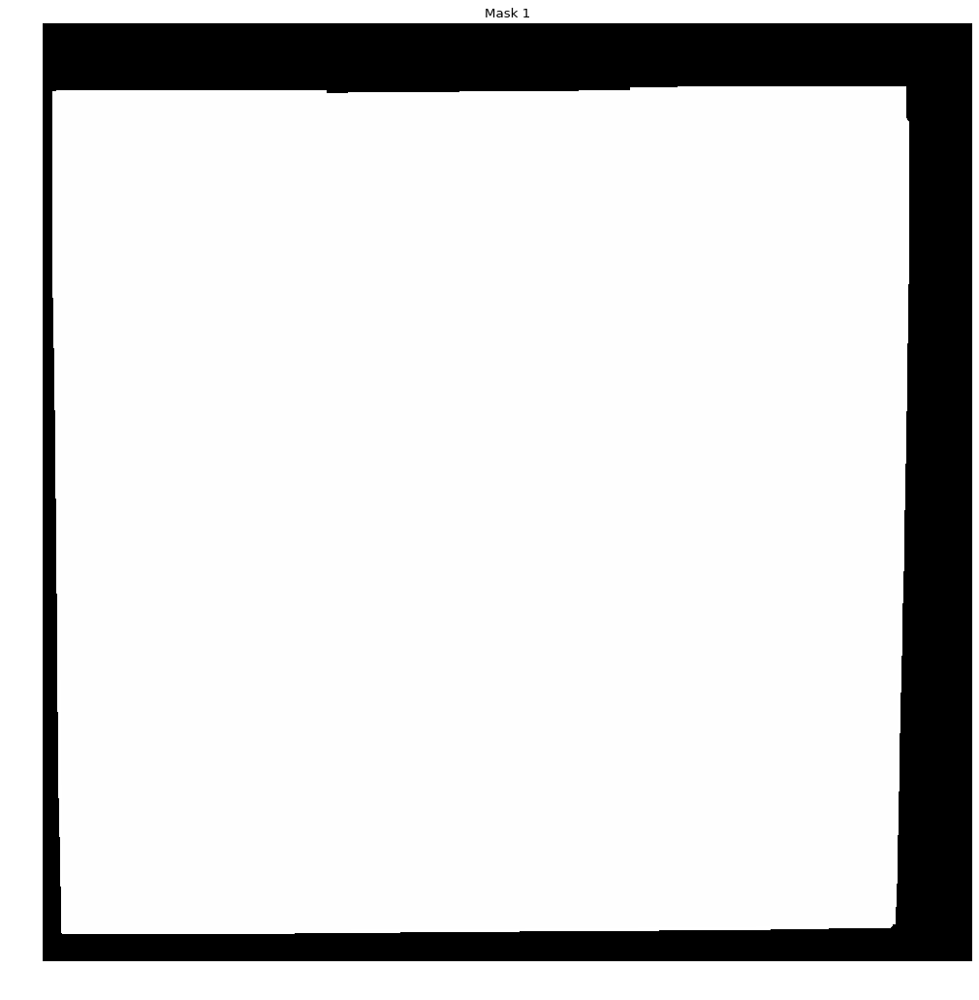

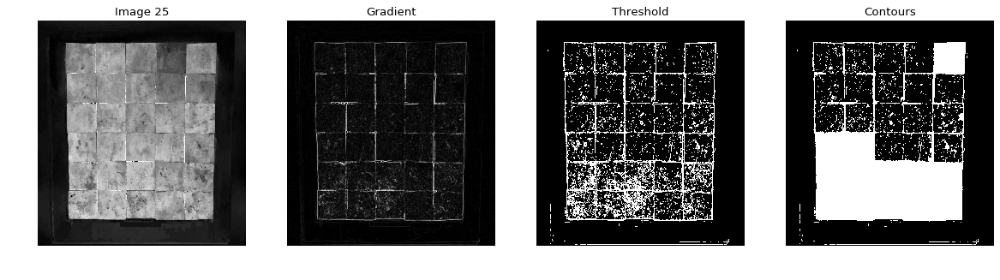

<Figure size 432x288 with 0 Axes>

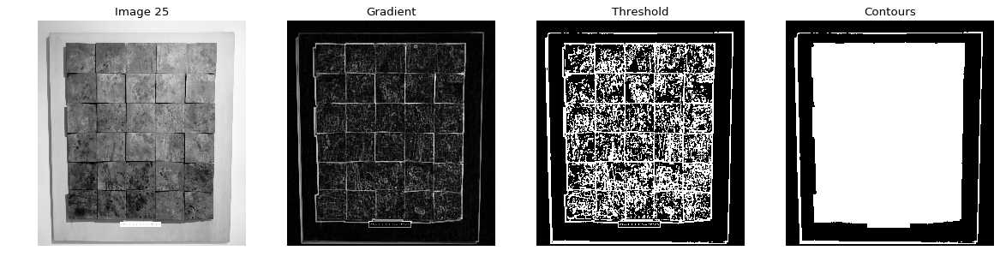

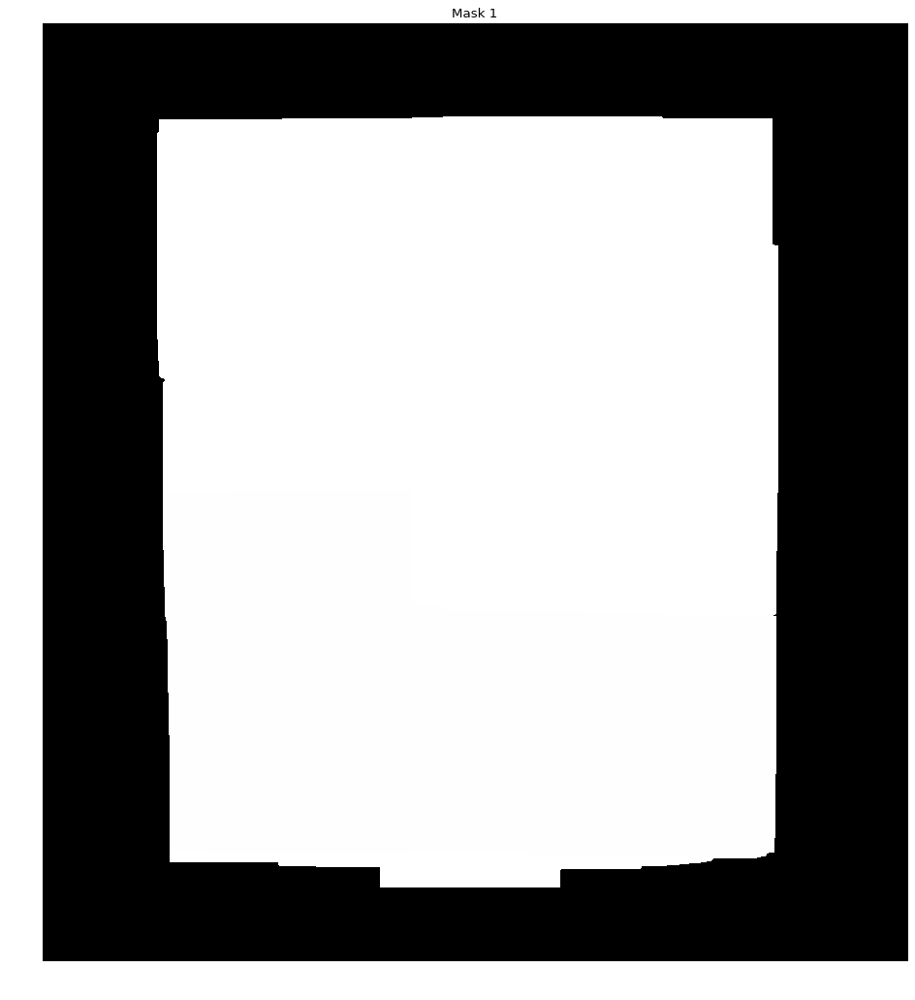

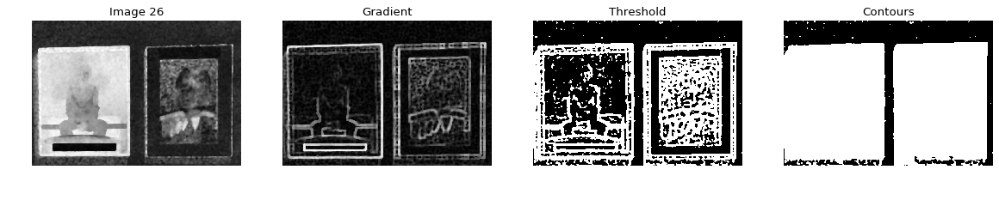

<Figure size 432x288 with 0 Axes>

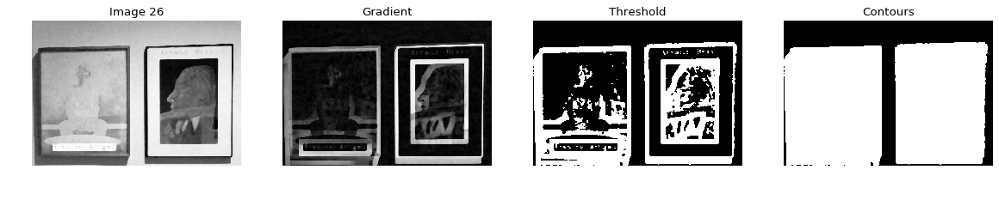

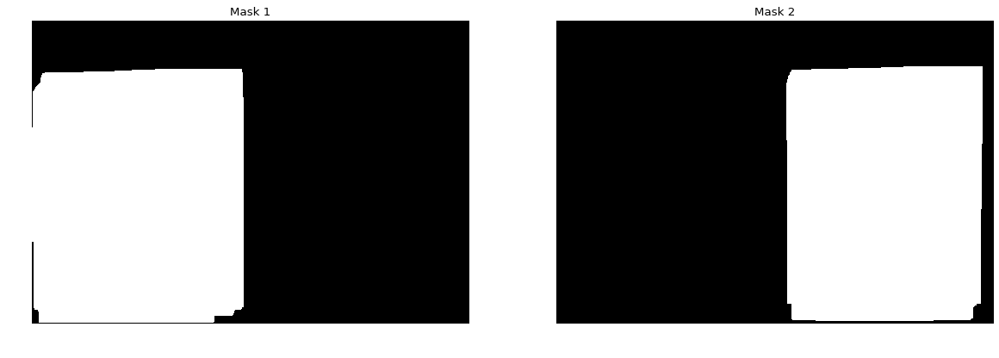

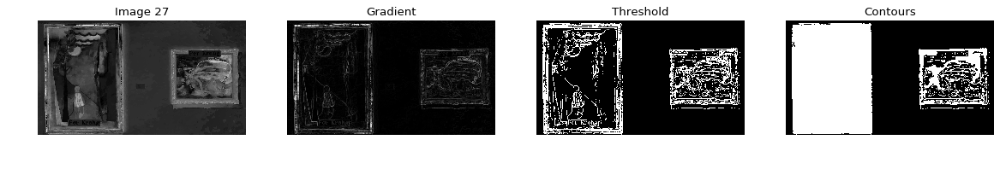

<Figure size 432x288 with 0 Axes>

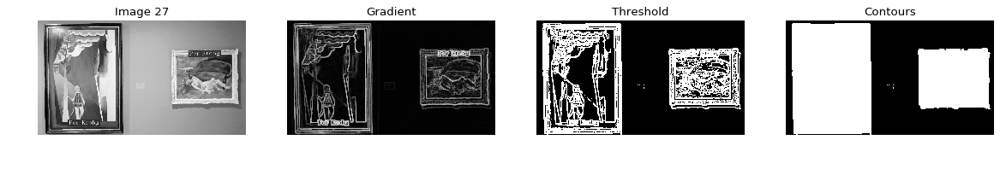

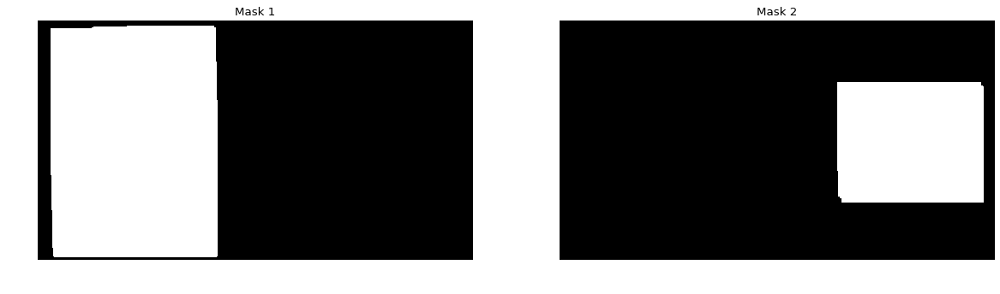

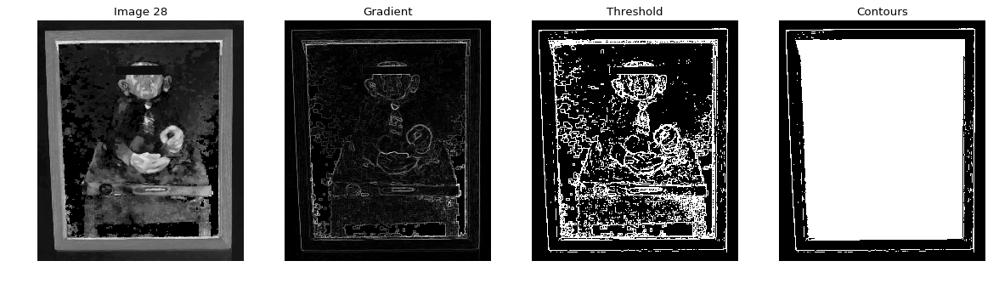

<Figure size 432x288 with 0 Axes>

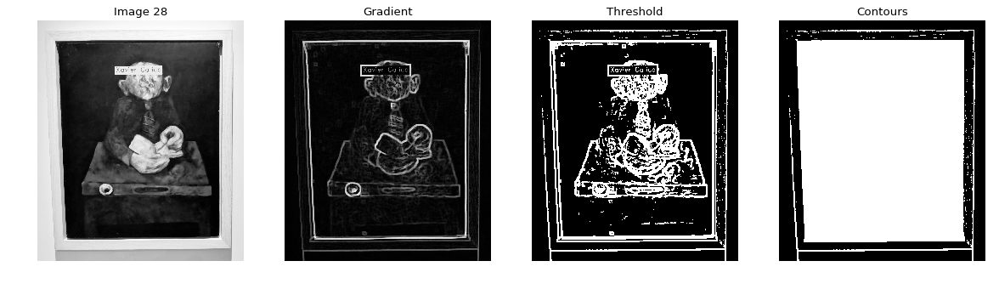

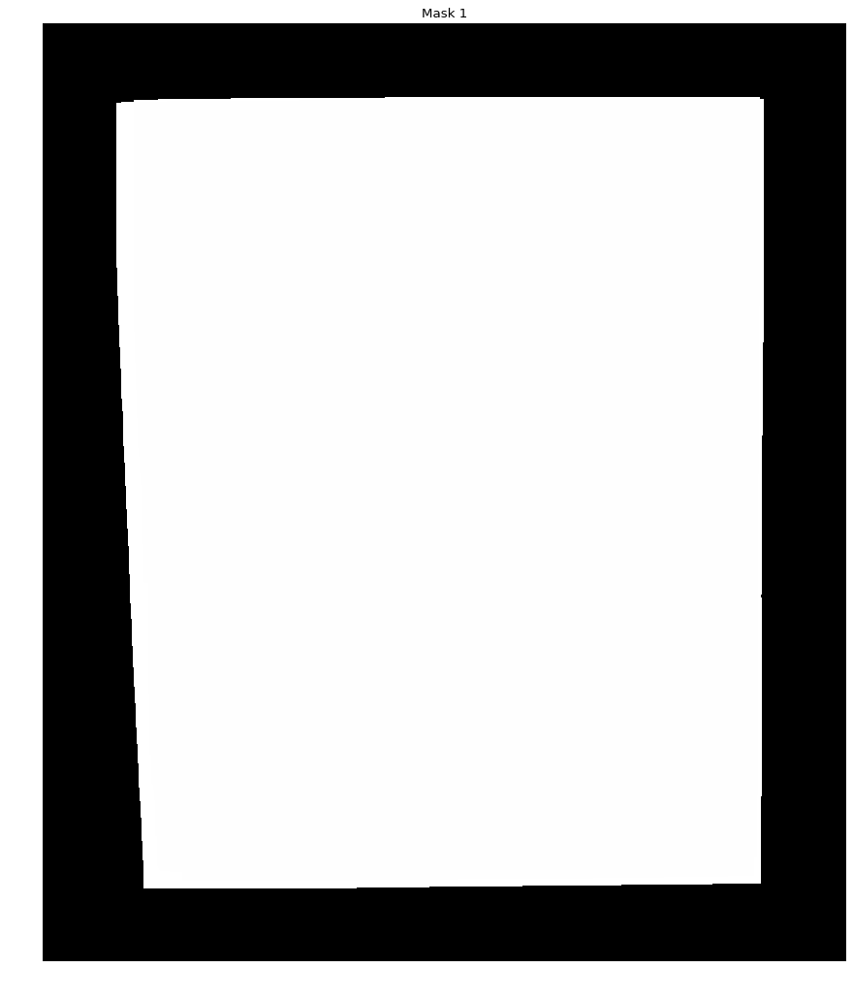

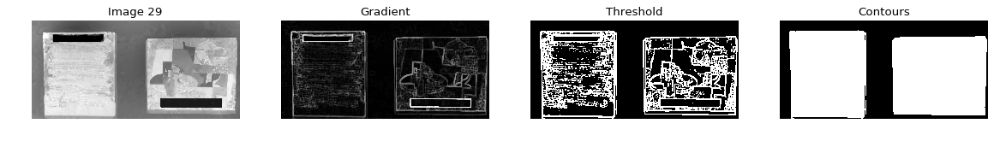

<Figure size 432x288 with 0 Axes>

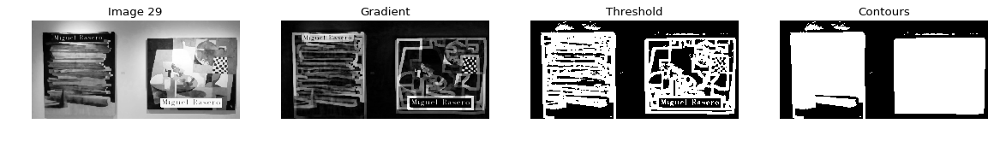

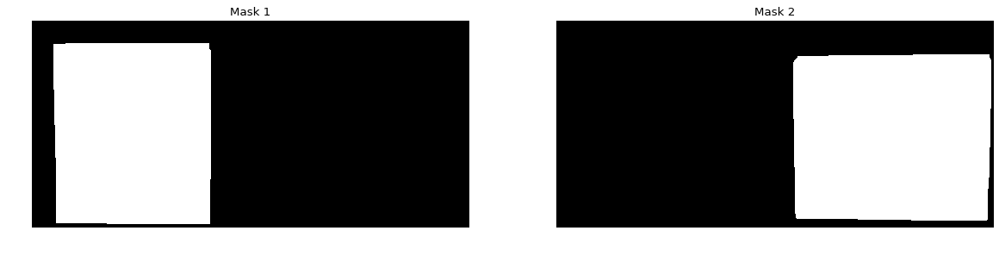

In [21]:
queries = []
fscore = []
qs = 'qsd1_w5'
img_bbdd = []

qs_l = '../qs/' + qs + '/*.jpg'

i=0
j=0

for f in sorted(glob.glob(qs_l)):
    # Read images
    name = os.path.splitext(os.path.split(f)[1])[0]
    img = cv.imread(f, cv.IMREAD_COLOR)
    img_bbdd.append(img)
    
    '''
    img = cv.cvtColor(img, cv.COLOR_BGR2LAB)
    img_median = cv.medianBlur(img,5)

    showImagesHorizontally([img_median[:,:,0], img_median[:,:,1], img_median[:,:,2]],["L", "A", "B"])
    showImagesHorizontally([cv.cvtColor(img, cv.COLOR_LAB2RGB),cv.cvtColor(img_median, cv.COLOR_LAB2RGB)],["Image", "Filtered image"])
    img = (img_median[:,:,0] + img_median[:,:,1] + img_median[:,:,2]) / 3
    '''
    
    img = cv.cvtColor(img, cv.COLOR_BGR2HSV)
    
    # Apply another median filter
    img_median = cv.medianBlur(img,3)
    img_median = cv.medianBlur(img_median,9)
    '''
    showImagesHorizontally([img_median[:,:,0], img_median[:,:,1], img_median[:,:,2]],["H | Min: " + str(np.min(img_median[:,:,0])) +" Max: " + str(np.max(img_median[:,:,0])),
                                                                                      "S | Min: " + str(np.min(img_median[:,:,1])) +" Max: " + str(np.max(img_median[:,:,1])),
                                                                                      "V | Min: " + str(np.min(img_median[:,:,2])) +" Max: " + str(np.max(img_median[:,:,2]))])
    showImagesHorizontally([cv.cvtColor(img, cv.COLOR_HSV2RGB),cv.cvtColor(img_median, cv.COLOR_HSV2RGB)],["Image " + str(j), "Filtered image"])
    '''
    #FUNCTION STARTS
    # Compute masks in two channels of the image
    img1 = img_median[:,:,1]
    img2 = img_median[:,:,2]

    height, width = np.shape(img1)

    # Compute morphological gradient by dilation (keep inner edges to remove wall posters)
    kernel = np.ones((20,20),np.uint8)
    img_dilation1 = cv.dilate(img1,kernel,iterations = 1)
    img_gradient1 = img_dilation1 - img1
    
    kernel = np.ones((40,40),np.uint8)
    img_dilation2 = cv.dilate(img2,kernel,iterations = 1)
    img_gradient2 = img_dilation2 - img2

    # Thresholding
    _,img_th1 = cv.threshold(img_gradient1, 20, 255, cv.THRESH_BINARY)
    _,img_th2 = cv.threshold(img_gradient2, 20, 255, cv.THRESH_BINARY)
    
    # Computing external contours
    _ ,contours1, _ = cv.findContours(img_th1, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    img_contour1 = np.zeros_like(img_th1)
    cv.drawContours(img_contour1, contours1, -1, 255, -1)
    
    _ ,contours2, _ = cv.findContours(img_th2, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    img_contour2 = np.zeros_like(img_th2)
    cv.drawContours(img_contour2, contours2, -1, 255, -1)

    # Opening to remove wall posters & others according to the image size
    size_h = round((1/6)*height)
    size_w = round((1/6)*width)
    kernel = np.ones((size_h,size_w),np.uint8)
    print(np.shape(kernel))
    
    '''
    lines = cv.HoughLinesP(img_contour2, 1, math.pi / 180.0, 100, minLineLength=100, maxLineGap=5)
    angles = []

    for x1, y1, x2, y2 in lines[0]:
        cv.line(mask, (x1, y1), (x2, y2), (255, 0, 0), 3)
        angle = math.degrees(math.atan2(y2 - y1, x2 - x1))
        angles.append(angle)

    median_angle = np.median(angles)
    print(median_angle)
    '''
    
    mask1 = cv.morphologyEx(img_contour1, cv.MORPH_OPEN, kernel)
    mask2 = cv.morphologyEx(img_contour2, cv.MORPH_OPEN, kernel)
    
    # Avoid all zeros image
    if(mask1.any()==0 and mask2.any()==0):
        mask = img_contour1
    else:
        mask = mask1 + mask2

    
    # Save mask
    cv.imwrite('masks/' + name + '.png', mask)

    # Compute evaluation metrics only if development set
    if (qs == 'qsd2_w1' or qs == 'qsd2_w2' or qs == 'qsd2_w3' or qs == 'qsd3_w3' or qs == 'qsd1_w4' or qs == 'qsd1_w5'):
        # Read ground truth
        g_t = cv.imread('../qs/' + qs + '/' + name + '.png', cv.IMREAD_COLOR)
        g_t = cv.cvtColor(g_t, cv.COLOR_BGR2GRAY)

        # Compute evaluation metrics
        pixelTP, pixelFP, pixelFN, pixelTN = performance_accumulation_pixel(mask,g_t)
        pixel_precision, pixel_accuracy, pixel_specificity, pixel_sensitivity = performance_evaluation_pixel(pixelTP, pixelFP, pixelFN, pixelTN)
        F1 = 2*pixel_precision*pixel_sensitivity/(pixel_precision+pixel_sensitivity)

        eval_metrics = [pixel_precision, pixel_accuracy, pixel_specificity, pixel_sensitivity, F1]
        '''
        print("Precision: "+str(pixel_precision))
        print("Accuracy: "+str(pixel_accuracy))
        print("Specificity: "+str(pixel_specificity))
        print("Recall (sensitivity): "+str(pixel_sensitivity))
        print("F1: "+str(F1))
        '''
    else:
        eval_metrics = [0,0,0,0,0]

    # DETECT IF THERE ARE TWO IMAGES
    # First method: check if the central mask is black
    '''
    central_column = round(width/2)
    central_column_mean = np.mean(mask[:,central_column:central_column+1])

    # If central column is not zero, analyze some extra columns
    # From 0.25 to 0.75 of the image, with a step of 100px
    if central_column_mean != 0:
        for i in range(round(0.5*(width/2)), round(1.5*(width/2)), 100):
            central_column_mean = np.mean(mask[:,i:i+1])
            if (central_column_mean == 0): # If found, exit for and keep central_column
                central_column = i
                break

    # If after the second attempt two masks are detected 
    if central_column_mean == 0:
        # Generate white masks
        mask_left = np.ones((height,width),np.uint8)
        mask_right = np.ones((height,width),np.uint8)

        # Compute
        mask_left[:,central_column:width] = 0
        mask_right[:,0:central_column] = 0
        mask_left = mask_left*mask
        mask_right = mask_right*mask
        bg_mask = [mask_left, mask_right]
        
        # If one mask is black, keep only the correct one
        if mask_left.any()==0:
            bg_mask = [mask_right]
        if mask_right.any()==0:
            bg_mask = [mask_left]

    else:
        bg_mask= [mask]
    '''

    # Second method: detect contours
    _, contours, hier = cv.findContours(mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)
    
    # If two paintings, return 2 masks
    if(np.shape(hier)[1] == 2):
        mask_1 = np.zeros_like(mask)
        mask_0 = np.zeros_like(mask)
        cv.fillPoly(mask_1, pts =[contours[0]], color=(255,255,255))
        cv.fillPoly(mask_0, pts =[contours[1]], color=(255,255,255))

        # Left and right mask in the correct order
        indices_0 = np.where(mask_0 != [0])
        indices_1 = np.where(mask_1 != [0])

        if(indices_0[0].size != 0 and indices_0[1].size !=0 and indices_1[0].size != 0 and indices_1[1].size !=0 ):
            if( min(indices_0[1]) < min(indices_1[1]) ):
                bg_mask = [mask_0, mask_1]
            else:
                bg_mask = [mask_1, mask_0]
    
    # If three paintings, return 3 masks
    elif(np.shape(hier)[1] == 3):
        mask_0 = np.zeros_like(mask)
        mask_1 = np.zeros_like(mask)
        mask_2 = np.zeros_like(mask)
        
        cv.fillPoly(mask_0, pts =[contours[0]], color=(255,255,255))
        cv.fillPoly(mask_1, pts =[contours[1]], color=(255,255,255))
        cv.fillPoly(mask_2, pts =[contours[2]], color=(255,255,255))

        masks = [mask_0, mask_1, mask_2]
        
        # Left and right mask in the correct order
        indices_0 = np.where(mask_0 != [0])
        indices_1 = np.where(mask_1 != [0])
        indices_2 = np.where(mask_2 != [0])

        if(indices_0[0].size != 0 and indices_0[1].size !=0 and indices_1[0].size != 0 and indices_1[1].size !=0 and indices_2[0].size != 0 and indices_2[1].size !=0 ):
            # Check which painting is on the left (lower Y index)
            minimum = [min(indices_0[1]), min(indices_1[1]), min(indices_2[1])]
            indices = np.argsort(minimum)
            
            # Return masks in order
            bg_mask = [masks[indices[0]], masks[indices[1]], masks[indices[2]]]
       
    else:
        bg_mask = [mask]


    # Final de funció 
    showImagesHorizontally([img1,img_gradient1,img_th1,img_contour1],["Image " + str(j), "Gradient","Threshold","Contours"])
    figure()
    showImagesHorizontally([img2,img_gradient2,img_th2,img_contour2],["Image " + str(j), "Gradient","Threshold","Contours"])
    
    print(np.shape(bg_mask))
    showImagesHorizontally(bg_mask,["Mask 1", "Mask 2", "Mask 3"])
    
    fscore.append(F1)
    
    j = j+1

print('F-measure: ' + str(np.mean(fscore)))

0.768442982500368


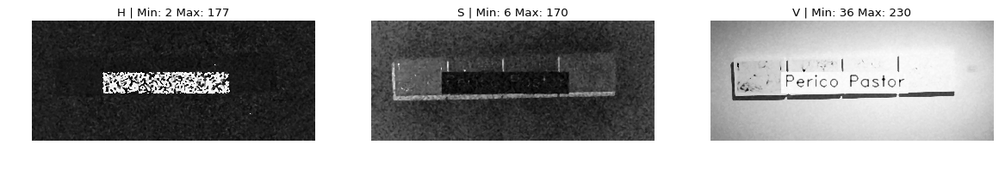

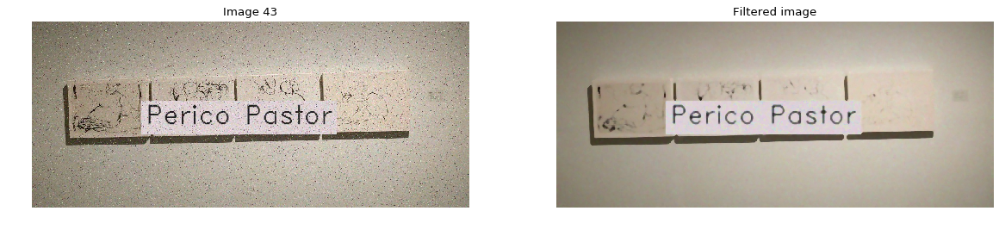

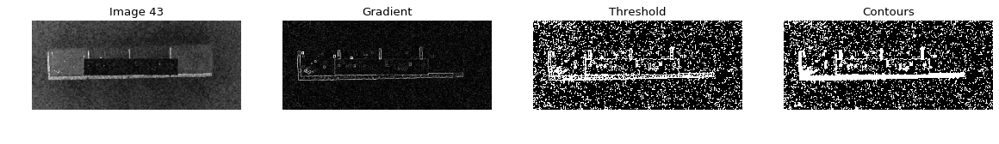

<Figure size 432x288 with 0 Axes>

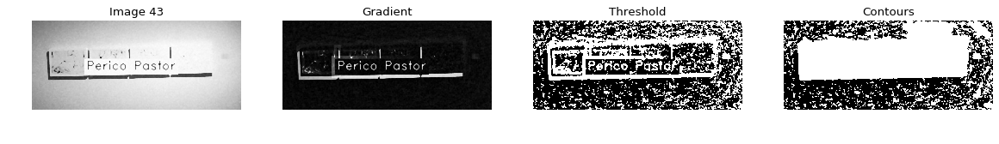

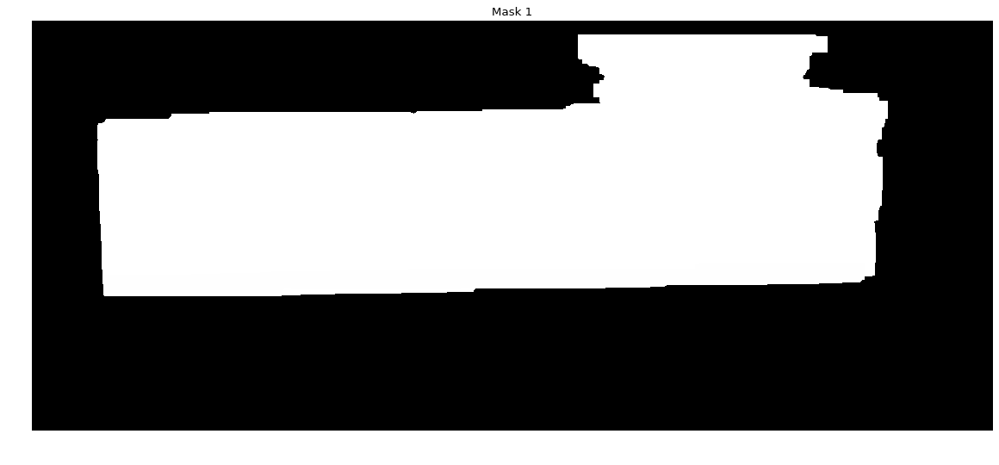

In [97]:
queries = []
fscore = []
i = 0

name = "00015"
img = cv.cvtColor(img_bbdd[15], cv.COLOR_BGR2HSV)
img_median = cv.medianBlur(img,3)
img_median = cv.medianBlur(img_median,9)

showImagesHorizontally([img_median[:,:,0], img_median[:,:,1], img_median[:,:,2]],["H | Min: " + str(np.min(img_median[:,:,0])) +" Max: " + str(np.max(img_median[:,:,0])),
                                                                                  "S | Min: " + str(np.min(img_median[:,:,1])) +" Max: " + str(np.max(img_median[:,:,1])),
                                                                                  "V | Min: " + str(np.min(img_median[:,:,2])) +" Max: " + str(np.max(img_median[:,:,2]))])
showImagesHorizontally([cv.cvtColor(img, cv.COLOR_HSV2RGB),cv.cvtColor(img_median, cv.COLOR_HSV2RGB)],["Image " + str(j), "Filtered image"])

img1 = img_median[:,:,1]
img2 = img_median[:,:,2]

'''
# Compute morphological gradient (dilation - erosion)
kernel = np.ones((20,20),np.uint8)
img_gradient = cv.morphologyEx(img, cv.MORPH_GRADIENT, kernel)
'''

#FUNCTION STARTS

height, width = np.shape(img1)

# Compute morphological gradient by dilation (keep inner edges to remove wall posters)
kernel = np.ones((10,10),np.uint8)
img_dilation1 = cv.dilate(img1,kernel,iterations = 1)
img_gradient1 = img_dilation1 - img1

kernel = np.ones((40,40),np.uint8)
img_dilation2 = cv.dilate(img2,kernel,iterations = 1)
img_gradient2 = img_dilation2 - img2

# Thresholding
_,img_th1 = cv.threshold(img_gradient1, 8, 255, cv.THRESH_BINARY)
#_,img_th = cv.threshold(img_gradient, 0, 255, cv.THRESH_OTSU)
_,img_th2 = cv.threshold(img_gradient2, 8, 255, cv.THRESH_BINARY)

# Computing external contours
contours1, _ = cv.findContours(img_th1, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
img_contour1 = np.zeros_like(img_th1)
cv.drawContours(img_contour1, contours1, -1, 255, -1)

contours2, _ = cv.findContours(img_th2, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
img_contour2 = np.zeros_like(img_th2)
cv.drawContours(img_contour2, contours2, -1, 255, -1)

# Opening to remove wall posters
kernel = np.ones((20,200),np.uint8)
mask1 = cv.morphologyEx(img_contour1, cv.MORPH_OPEN, kernel)

kernel = np.ones((20,200),np.uint8)
mask2 = cv.morphologyEx(img_contour2, cv.MORPH_OPEN, kernel)

# Avoid all zeros image
if(mask1.any()==0 and mask2.any()==0):
    mask = img_contour1
else:
    mask = mask1 + mask2

# Save mask
cv.imwrite('masks/' + name + '.png', mask)

 # Read ground truth
g_t = cv.imread('../qs/' + QUERY_SET + '/' + name + '.png', cv.IMREAD_COLOR)
g_t = cv.cvtColor(g_t, cv.COLOR_BGR2GRAY)

# Compute evaluation metrics
pixelTP, pixelFP, pixelFN, pixelTN = performance_accumulation_pixel(mask,g_t)
pixel_precision, pixel_accuracy, pixel_specificity, pixel_sensitivity = performance_evaluation_pixel(pixelTP, pixelFP, pixelFN, pixelTN)
F1 = 2*pixel_precision*pixel_sensitivity/(pixel_precision+pixel_sensitivity)

eval_metrics = [pixel_precision, pixel_accuracy, pixel_specificity, pixel_sensitivity, F1]
'''
print("Precision: "+str(pixel_precision))
print("Accuracy: "+str(pixel_accuracy))
print("Specificity: "+str(pixel_specificity))
print("Recall (sensitivity): "+str(pixel_sensitivity))
print("F1: "+str(F1))
'''

# DETECT IF THERE ARE TWO IMAGES
# First method: check if the central mask is black
central_column = round(width/2)
central_column_mean = np.mean(mask[:,central_column:central_column+1])

# If central column is not zero, analyze some extra columns
# From 0.25 to 0.75 of the image, with a step of 100px
if central_column_mean != 0:
    for i in range(round(0.5*(width/2)), round(1.5*(width/2)), 100):
        central_column_mean = np.mean(mask[:,i:i+1])
        if (central_column_mean == 0): # If found, exit for and keep central_column
            central_column = i
            break

# If after the second attempt two masks are detected 
if central_column_mean == 0:
    # Generate white masks
    mask_left = np.ones((height,width),np.uint8)
    mask_right = np.ones((height,width),np.uint8)

    # Compute
    mask_left[:,central_column:width] = 0
    mask_right[:,0:central_column] = 0
    mask_left = mask_left*mask
    mask_right = mask_right*mask
    bg_mask = [mask_left, mask_right]     

else:
    bg_mask= [mask]

# Final de funció 
showImagesHorizontally([img1,img_gradient1,img_th1,img_contour1],["Image " + str(j), "Gradient","Threshold","Contours"])
figure()
showImagesHorizontally([img2,img_gradient2,img_th2,img_contour2],["Image " + str(j), "Gradient","Threshold","Contours"])

showImagesHorizontally(bg_mask,["Mask 1", "Mask 2"])

print(F1)

j = j+1


